In [1]:
# project uses the caltech101 dataset found here https://data.caltech.edu/records/mzrjq-6wc02

%pip install tensorflow
%pip install keras
%pip install matplotlib
%pip install tensorflow_datasets
%pip install numpy
%pip install seaborn
%pip install scikit-learn

import tensorflow as tf
import tensorflow_datasets as tfds
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator


Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [2]:
# Load dataset
train_data, test_data = tfds.load('caltech101', split=['train', 'test'], shuffle_files=True, as_supervised=True)

print(f"Training set size: {len(list(train_data))}")
print(f"Test set size: {len(list(test_data))}")

for image, label in train_data.take(1):
    print(f"Image shape: {image.shape}")
    print(f"Label: {label.numpy()}")

info = tfds.builder('caltech101').info
class_names = info.features['label'].names
print(f"Total classes: {len(class_names)}")



2024-11-01 20:47:24.822501: I tensorflow/core/kernels/data/tf_record_dataset_op.cc:376] The default buffer size is 262144, which is overridden by the user specified `buffer_size` of 8388608
2024-11-01 20:47:25.034054: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Training set size: 3060
Test set size: 6084
Image shape: (297, 300, 3)
Label: 10
Total classes: 102


2024-11-01 20:47:25.796141: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


2024-11-01 20:47:25.880635: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


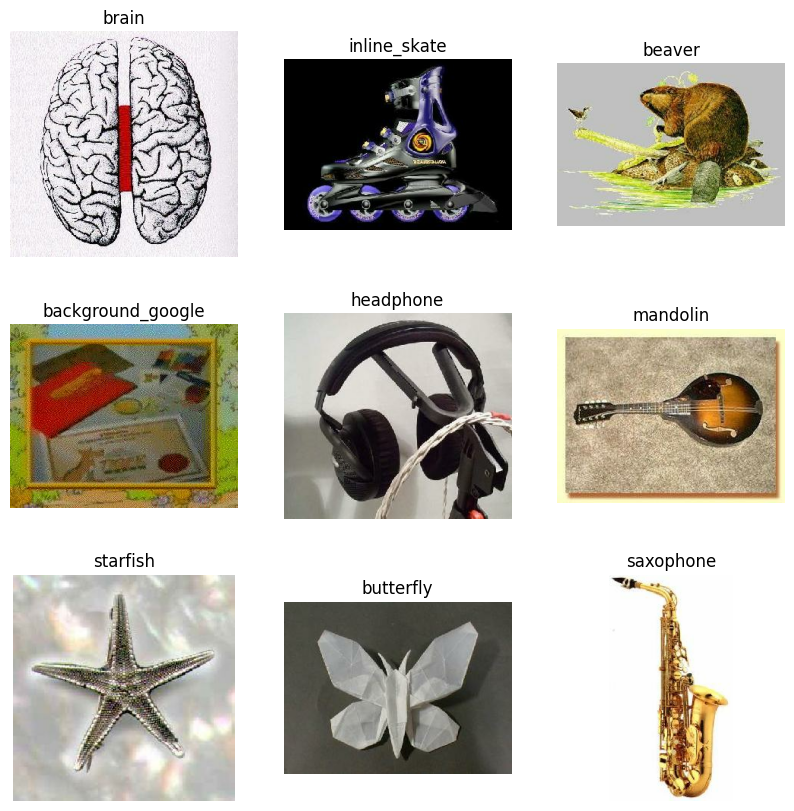

In [3]:
fig = plt.figure(figsize=(10, 10))
for i, (image, label) in enumerate(train_data.take(9)):
    ax = fig.add_subplot(3, 3, i + 1)
    ax.imshow(image.numpy())
    ax.set_title(class_names[label.numpy()])
    ax.axis('off')
plt.show()

In [4]:
# Counting instances per class
import collections
label_counts = collections.Counter([label.numpy() for _, label in train_data])
print(label_counts)


Counter({10: 30, 51: 30, 7: 30, 4: 30, 47: 30, 61: 30, 87: 30, 13: 30, 79: 30, 94: 30, 54: 30, 99: 30, 40: 30, 88: 30, 60: 30, 70: 30, 78: 30, 45: 30, 97: 30, 46: 30, 8: 30, 67: 30, 19: 30, 36: 30, 52: 30, 49: 30, 26: 30, 43: 30, 92: 30, 58: 30, 73: 30, 15: 30, 57: 30, 101: 30, 72: 30, 23: 30, 74: 30, 59: 30, 35: 30, 93: 30, 17: 30, 25: 30, 76: 30, 39: 30, 50: 30, 12: 30, 98: 30, 90: 30, 96: 30, 56: 30, 9: 30, 28: 30, 91: 30, 30: 30, 44: 30, 80: 30, 55: 30, 84: 30, 48: 30, 75: 30, 38: 30, 2: 30, 65: 30, 53: 30, 81: 30, 3: 30, 16: 30, 68: 30, 29: 30, 20: 30, 31: 30, 69: 30, 1: 30, 82: 30, 63: 30, 95: 30, 85: 30, 32: 30, 77: 30, 42: 30, 64: 30, 71: 30, 0: 30, 89: 30, 5: 30, 27: 30, 83: 30, 34: 30, 22: 30, 41: 30, 33: 30, 14: 30, 11: 30, 6: 30, 18: 30, 86: 30, 66: 30, 100: 30, 62: 30, 24: 30, 21: 30, 37: 30})


In [5]:
# Print all label names
print("Class Names:")
for i, class_name in enumerate(class_names):
    print(f"{i}: {class_name}")

Class Names:
0: accordion
1: airplanes
2: anchor
3: ant
4: background_google
5: barrel
6: bass
7: beaver
8: binocular
9: bonsai
10: brain
11: brontosaurus
12: buddha
13: butterfly
14: camera
15: cannon
16: car_side
17: ceiling_fan
18: cellphone
19: chair
20: chandelier
21: cougar_body
22: cougar_face
23: crab
24: crayfish
25: crocodile
26: crocodile_head
27: cup
28: dalmatian
29: dollar_bill
30: dolphin
31: dragonfly
32: electric_guitar
33: elephant
34: emu
35: euphonium
36: ewer
37: faces
38: faces_easy
39: ferry
40: flamingo
41: flamingo_head
42: garfield
43: gerenuk
44: gramophone
45: grand_piano
46: hawksbill
47: headphone
48: hedgehog
49: helicopter
50: ibis
51: inline_skate
52: joshua_tree
53: kangaroo
54: ketch
55: lamp
56: laptop
57: leopards
58: llama
59: lobster
60: lotus
61: mandolin
62: mayfly
63: menorah
64: metronome
65: minaret
66: motorbikes
67: nautilus
68: octopus
69: okapi
70: pagoda
71: panda
72: pigeon
73: pizza
74: platypus
75: pyramid
76: revolver
77: rhino
78: r

Training set size after filtering: 3030
Test set size after filtering: 5647
Image shape: (297, 300, 3)
Label: 10


2024-11-01 20:47:26.969577: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


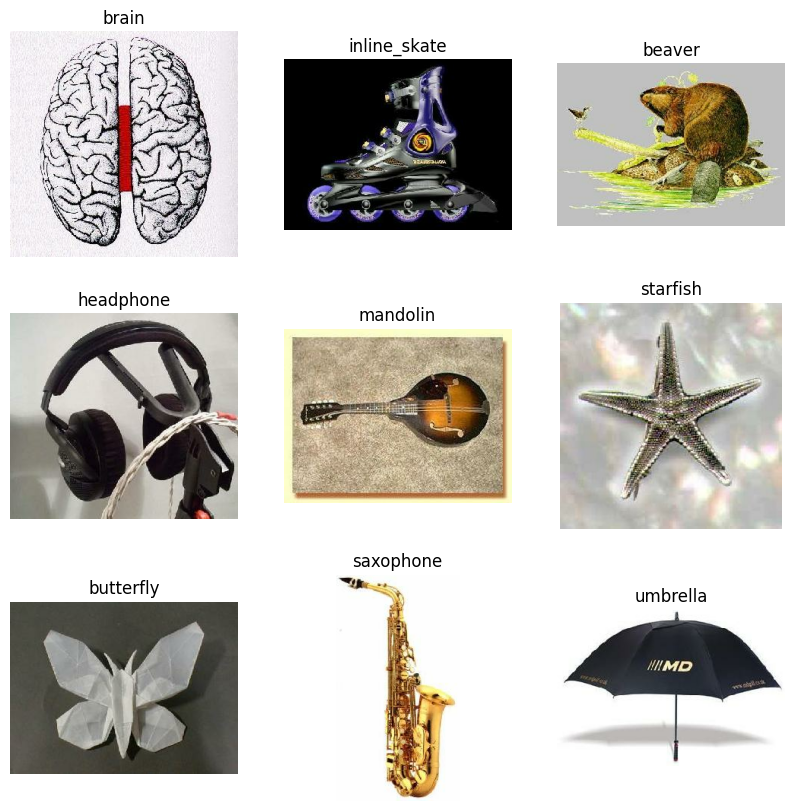

Counter({10: 30, 51: 30, 7: 30, 47: 30, 61: 30, 87: 30, 13: 30, 79: 30, 94: 30, 54: 30, 99: 30, 40: 30, 88: 30, 60: 30, 70: 30, 78: 30, 45: 30, 97: 30, 46: 30, 8: 30, 67: 30, 19: 30, 36: 30, 52: 30, 49: 30, 26: 30, 43: 30, 92: 30, 58: 30, 73: 30, 15: 30, 57: 30, 101: 30, 72: 30, 23: 30, 74: 30, 59: 30, 35: 30, 93: 30, 17: 30, 25: 30, 76: 30, 39: 30, 50: 30, 12: 30, 98: 30, 90: 30, 96: 30, 56: 30, 9: 30, 28: 30, 91: 30, 30: 30, 44: 30, 80: 30, 55: 30, 84: 30, 48: 30, 75: 30, 38: 30, 2: 30, 65: 30, 53: 30, 81: 30, 3: 30, 16: 30, 68: 30, 29: 30, 20: 30, 31: 30, 69: 30, 1: 30, 82: 30, 63: 30, 95: 30, 85: 30, 32: 30, 77: 30, 42: 30, 64: 30, 71: 30, 0: 30, 89: 30, 5: 30, 27: 30, 83: 30, 34: 30, 22: 30, 41: 30, 33: 30, 14: 30, 11: 30, 6: 30, 18: 30, 86: 30, 66: 30, 100: 30, 62: 30, 24: 30, 21: 30, 37: 30})


In [6]:
# Get class names and find the index of "google_background"
info = tfds.builder('caltech101').info
class_names = info.features['label'].names
google_background_index = class_names.index("background_google")

# Define a filter function to exclude "google_background"
def filter_google_background(image, label):
    return tf.not_equal(label, google_background_index)

# Apply the filter to each dataset split
train_data = train_data.filter(filter_google_background)
test_data = test_data.filter(filter_google_background)

# Verifying the dataset sizes after filtering
print(f"Training set size after filtering: {len(list(train_data))}")
print(f"Test set size after filtering: {len(list(test_data))}")

# Print the first image and label from the filtered training set
for image, label in train_data.take(1):
    print(f"Image shape: {image.shape}")
    print(f"Label: {label.numpy()}")

# Visualize a few filtered images
fig = plt.figure(figsize=(10, 10))
for i, (image, label) in enumerate(train_data.take(9)):
    ax = fig.add_subplot(3, 3, i + 1)
    ax.imshow(image.numpy())
    ax.set_title(class_names[label.numpy()])
    ax.axis('off')
plt.show()

# Counting instances per class after filtering
label_counts = collections.Counter([label.numpy() for _, label in train_data])
print(label_counts)

In [7]:
# Resize images
def resize_image(image, label):
    image = tf.image.resize(image, [128, 128])
    return image, label

train_data = train_data.map(resize_image)
test_data = test_data.map(resize_image)

# Normalize images
def normalize_image(image, label):
    image = tf.cast(image, tf.float32) / 255.0
    return image, label

train_data = train_data.map(normalize_image)
test_data = test_data.map(normalize_image)

# Data augmentation
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomRotation(0.1),
    tf.keras.layers.RandomContrast(0.3),
    tf.keras.layers.RandomZoom(0.15),
    tf.keras.layers.RandomTranslation(0.15, 0.15)
])

# Function to apply augmentation
def augment_image(image, label):
    image = data_augmentation(image)
    return image, label

# Function to expand training data with augmentation
def expand_training_data(train_data, n_augments):
    augmented_datasets = [train_data]  # Original data

    for _ in range(n_augments):
        augmented_data = train_data.map(augment_image)
        augmented_datasets.append(augmented_data)

    # Concatenate the original and augmented datasets
    full_train_data = augmented_datasets[0]
    for aug_data in augmented_datasets[1:]:
        full_train_data = full_train_data.concatenate(aug_data)

    return full_train_data

# Generate expanded training data
train_data = expand_training_data(train_data, n_augments=2)
train_data_size = len(list(train_data))
train_data = train_data.shuffle(buffer_size=train_data_size)

# Edge detection
def edge_detection(image, label):
    # Convert image to grayscale
    image_gray = tf.image.rgb_to_grayscale(image)
    # Add batch dimension to the grayscale image
    image_gray = tf.expand_dims(image_gray, axis=0)
    # Apply Sobel edge detection
    edges = tf.image.sobel_edges(image_gray)
    edge_x = edges[..., 0]
    edge_y = edges[..., 1]
    # Combine the edges
    edges = tf.sqrt(tf.square(edge_x) + tf.square(edge_y))
    # Remove the extra dimension
    edges = tf.squeeze(edges, axis=0)
    edges = tf.clip_by_value(edges, 0.0, 1.0)
    return edges, label

train_data = train_data.map(edge_detection)
test_data = test_data.map(edge_detection)

# Apply batching and prefetching without one-hot encoding
train_data = train_data.batch(32, drop_remainder=True).prefetch(tf.data.AUTOTUNE)
test_data = test_data.batch(32, drop_remainder=True).prefetch(tf.data.AUTOTUNE)

In [8]:
print(f"Training set size: {len(list(train_data))}")
print(f"Test set size: {len(list(test_data))}")

for image, label in train_data.take(1):
    print(f"Image shape: {image.shape}")
    print(f"Label: {label.numpy()}")

Training set size: 284
Test set size: 176
Image shape: (32, 128, 128, 1)
Label: [ 3 60 97  3  8 21 36 25 35 16 14 98 46 76 59 93 93 59 32 38 24 78 64 34
 13 72 50 96 80 19 82 98]


In [9]:
import seaborn as sns

def print_results():
    # Extract test images and labels from the test dataset
    test_images, test_labels = zip(*[(image, label) for image, label in tfds.as_numpy(test_data)])
    test_images = np.array([image for batch in test_images for image in batch])
    test_labels = np.array([label for batch in test_labels for label in batch])

    # Generate predictions
    predictions = model.predict(test_images)
    predicted_classes = np.argmax(predictions, axis=1)

    # Calculate accuracy manually
    accuracy = np.sum(predicted_classes == test_labels) / len(test_labels)
    print(f"Accuracy: {accuracy * 100:.2f}%")

    # Calculate confusion matrix
    num_classes = len(class_names)
    confusion_matrix = np.zeros((num_classes, num_classes), dtype=int)

    for true, pred in zip(test_labels, predicted_classes):
        confusion_matrix[true, pred] += 1

    # Plot confusion matrix
    plt.figure(figsize=(20, 16))
    mask = confusion_matrix == 0  # Mask to avoid annotating zeroes
    sns.heatmap(confusion_matrix, annot=~mask, fmt='d', cmap='Blues',
                xticklabels=class_names, yticklabels=class_names,
                cbar_kws={'label': 'Count'}, linewidths=0.5, linecolor='gray')
    plt.title("Confusion Matrix")
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.xticks(rotation=45, ha="right", fontsize=10)
    plt.yticks(fontsize=10)
    plt.tight_layout()
    plt.show()

    # Plot training history
    plt.plot(history.history['accuracy'], label='train_accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend(loc='lower right')
    plt.show()

Epoch 1/10


/opt/miniconda3/envs/ml/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


284/284 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - accuracy: 0.0283 - loss: 4.5305
Epoch 2/10


/opt/miniconda3/envs/ml/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


284/284 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - accuracy: 0.2186 - loss: 3.5111
Epoch 3/10


2024-11-01 20:49:13.036253: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


284/284 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - accuracy: 0.3228 - loss: 2.9472
Epoch 4/10
284/284 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - accuracy: 0.3894 - loss: 2.6153
Epoch 5/10
284/284 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - accuracy: 0.4467 - loss: 2.3597
Epoch 6/10
284/284 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - accuracy: 0.4813 - loss: 2.2230
Epoch 7/10
284/284 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - accuracy: 0.5062 - loss: 2.0922
Epoch 8/10
284/284 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - accuracy: 0.5217 - loss: 2.0224
Epoch 9/10
284/284 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - accuracy: 0.5446 - loss: 1.9024
Epoch 10/10
284/284 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - accuracy: 0.5786 - loss: 1.7846
176/176 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step
Accuracy: 62.32%


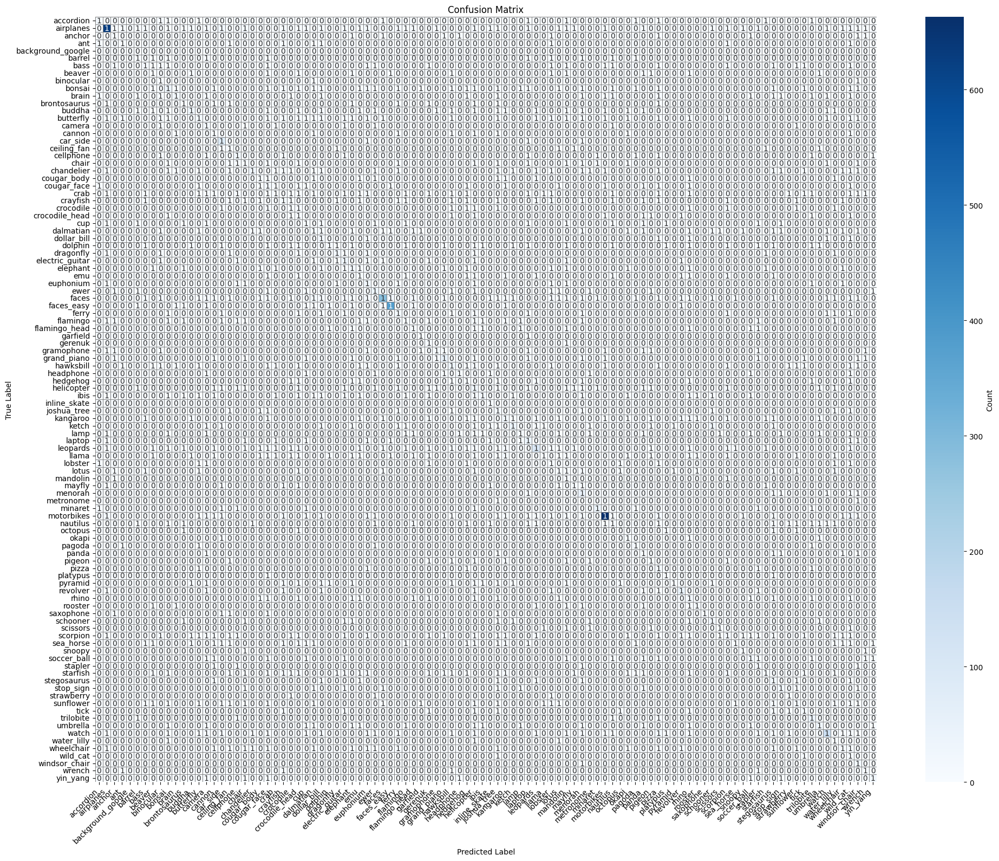

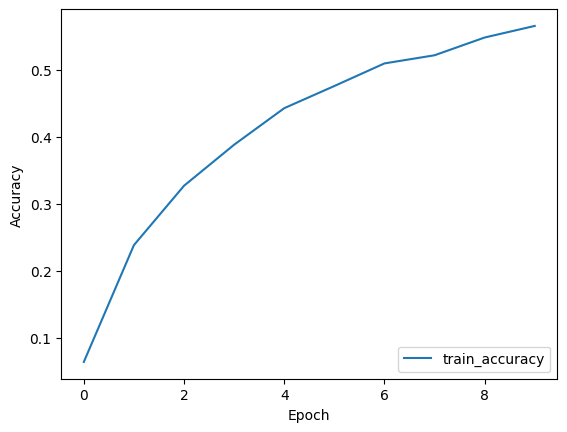

In [10]:

def create_model():
    model = tf.keras.models.Sequential([
        tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 1)),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Conv2D(128, (3, 3), activation='relu'),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(128, activation='relu'),
        tf.keras.layers.Dense(len(class_names), activation='softmax')
    ])
    return model

model = create_model()
model.compile(    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = model.fit(train_data, epochs=10)

print_results()


176/176 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step
Accuracy: 62.32%


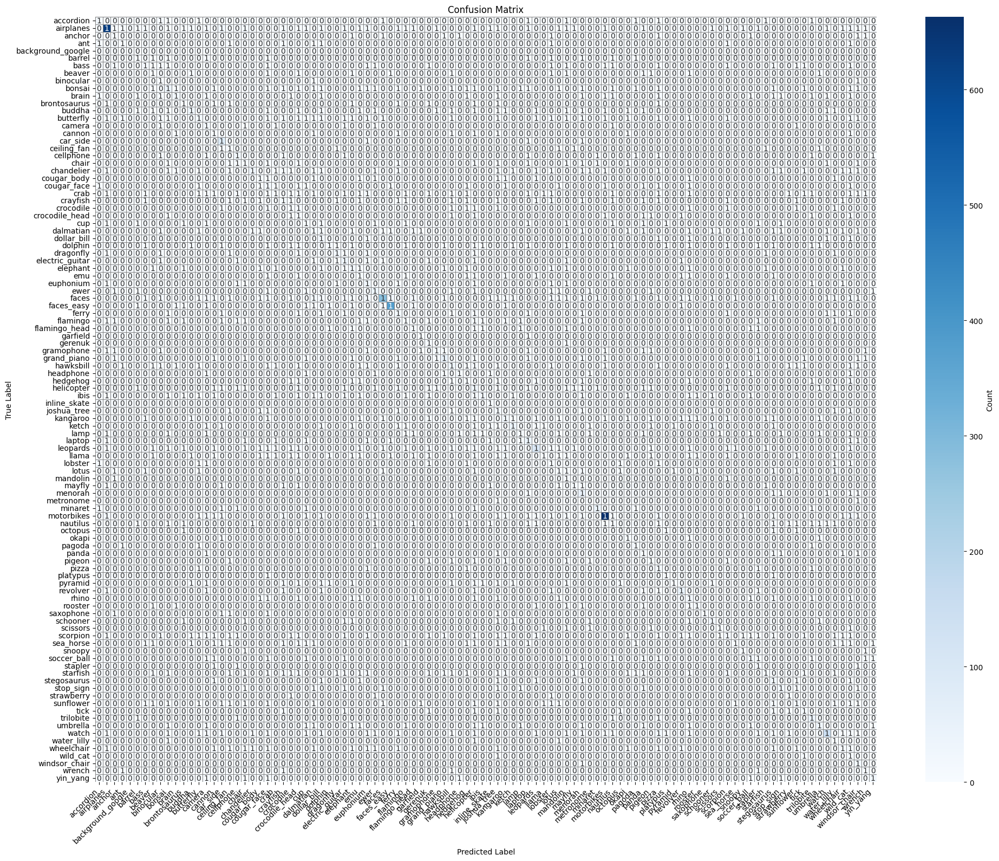

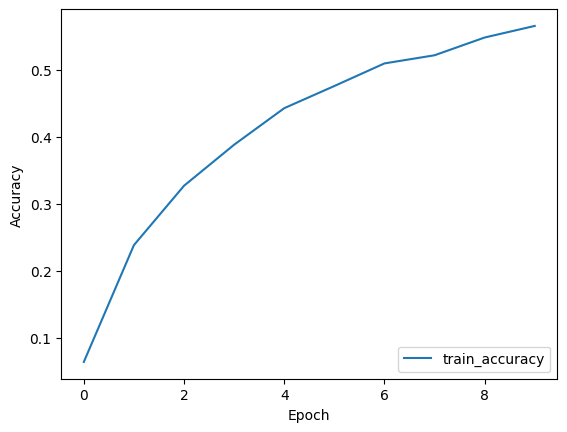

In [11]:
print_results()

Epoch 1/10


/opt/miniconda3/envs/ml/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


284/284 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - accuracy: 0.0142 - loss: 4.6091
Epoch 2/10


/opt/miniconda3/envs/ml/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


284/284 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - accuracy: 0.0544 - loss: 4.3415
Epoch 3/10
284/284 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - accuracy: 0.1336 - loss: 3.9285
Epoch 4/10
284/284 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - accuracy: 0.1865 - loss: 3.6044
Epoch 5/10
284/284 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - accuracy: 0.2413 - loss: 3.3228
Epoch 6/10
284/284 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - accuracy: 0.2900 - loss: 3.1365
Epoch 7/10


2024-11-01 20:58:20.414105: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


284/284 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - accuracy: 0.3260 - loss: 2.9337
Epoch 8/10
284/284 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - accuracy: 0.3553 - loss: 2.8473
Epoch 9/10
284/284 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - accuracy: 0.3711 - loss: 2.7397
Epoch 10/10
284/284 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - accuracy: 0.4156 - loss: 2.5811
176/176 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step
Accuracy: 54.49%


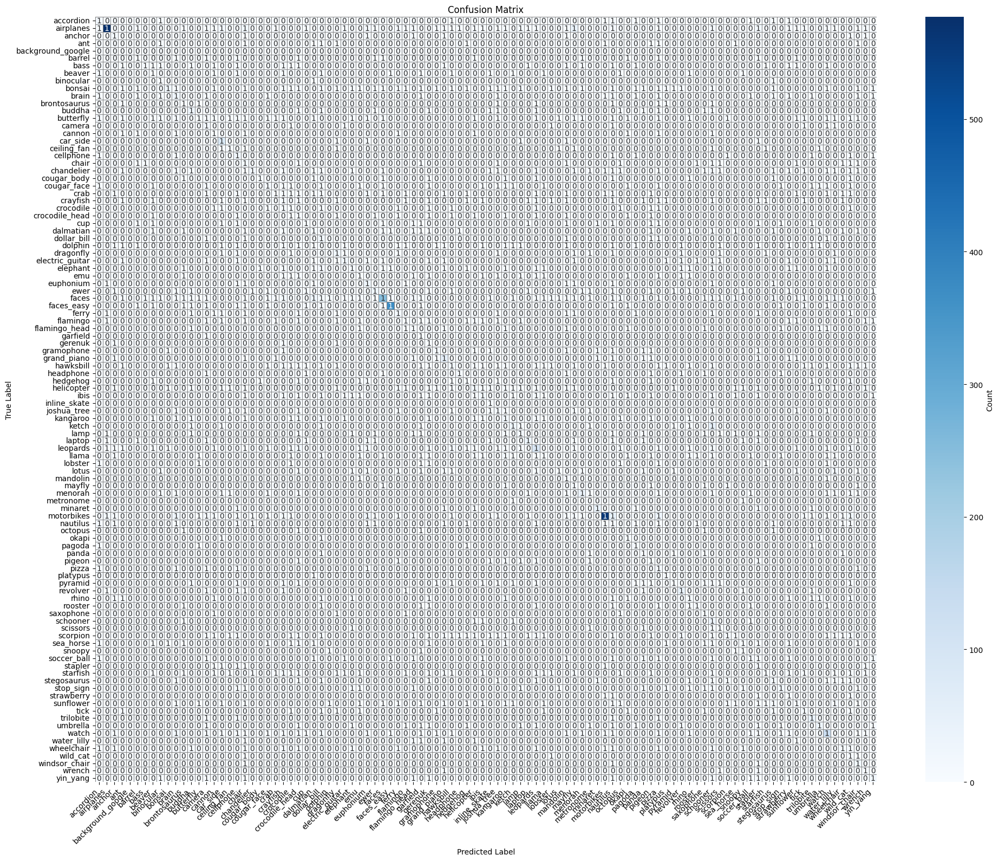

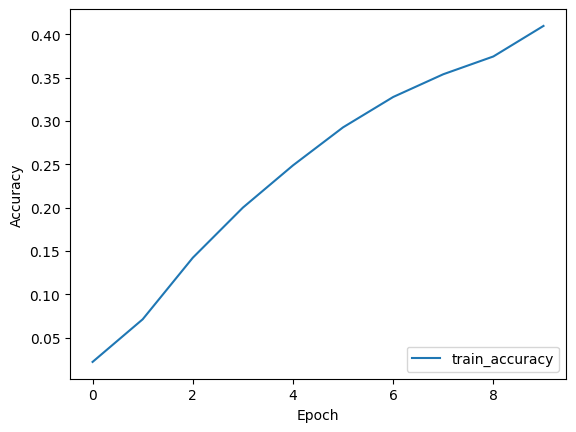

In [12]:

# model with slower learning rate
def create_model():
    model = tf.keras.models.Sequential([
        tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 1)),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Conv2D(128, (3, 3), activation='relu'),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(128, activation='relu'),
        tf.keras.layers.Dense(len(class_names), activation='softmax')
    ])
    return model

model = create_model()


model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = model.fit(train_data, epochs=10)

print_results()



Epoch 1/10


/opt/miniconda3/envs/ml/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


284/284 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - accuracy: 0.0074 - loss: 5.4236
Epoch 2/10


/opt/miniconda3/envs/ml/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


284/284 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - accuracy: 0.0083 - loss: 4.6211
Epoch 3/10
284/284 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - accuracy: 0.0103 - loss: 4.6200
Epoch 4/10
284/284 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - accuracy: 0.0100 - loss: 4.6199
Epoch 5/10
284/284 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - accuracy: 0.0108 - loss: 4.6192
Epoch 6/10
284/284 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - accuracy: 0.0066 - loss: 4.6194
Epoch 7/10
284/284 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - accuracy: 0.0067 - loss: 4.6204
Epoch 8/10
284/284 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - accuracy: 0.0102 - loss: 4.6202
Epoch 9/10
284/284 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - accuracy: 0.0091 - loss: 4.6196
Epoch 10/10
284/284 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - accuracy: 0.0075 - loss: 4.6198
176/176 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step
Accuracy: 13.60%


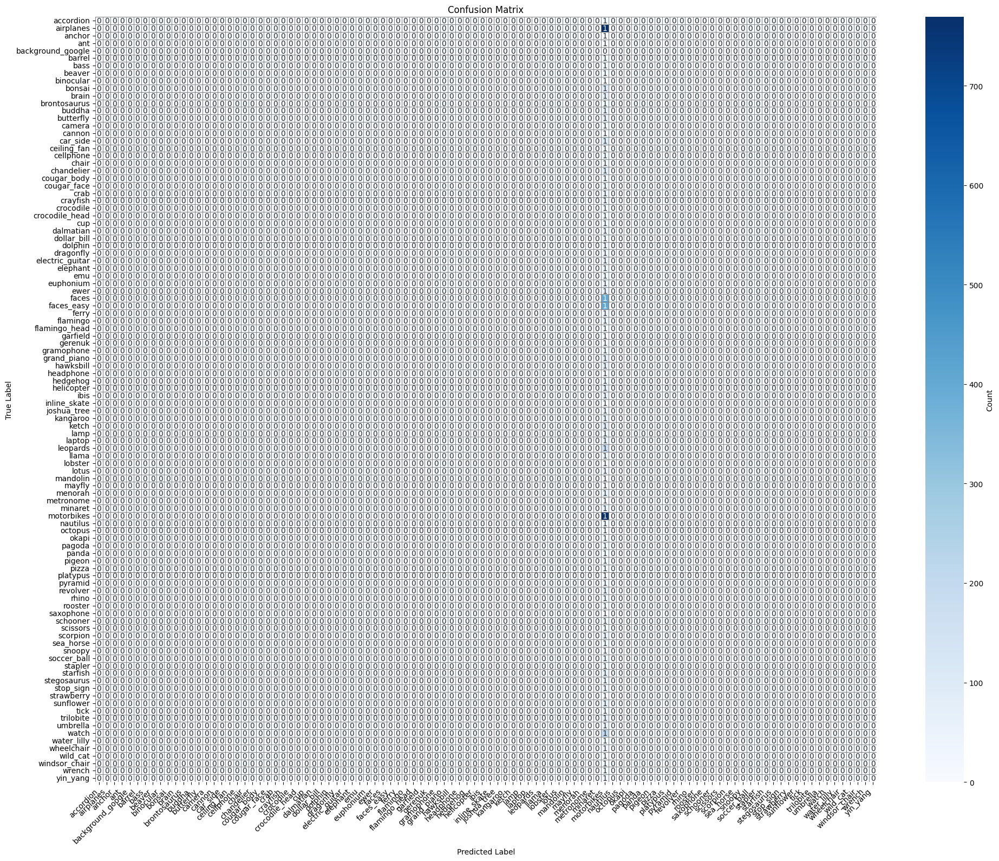

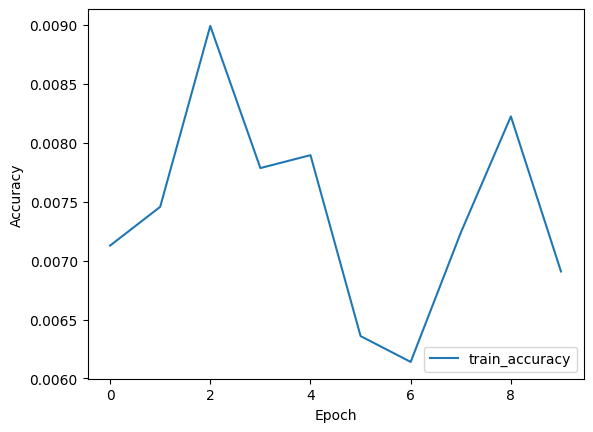

In [13]:

# model with faster learning rate
def create_model():
    model = tf.keras.models.Sequential([
        tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 1)),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Conv2D(128, (3, 3), activation='relu'),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(128, activation='relu'),
        tf.keras.layers.Dense(len(class_names), activation='softmax')
    ])
    return model

model = create_model()
# larger learning rate
model.compile(    optimizer=tf.keras.optimizers.Adam(learning_rate=0.01), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = model.fit(train_data, epochs=10)

print_results()


Epoch 1/10


/opt/miniconda3/envs/ml/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


284/284 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - accuracy: 0.0181 - loss: 4.5857
Epoch 2/10


/opt/miniconda3/envs/ml/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


284/284 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - accuracy: 0.0883 - loss: 4.0525
Epoch 3/10
284/284 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - accuracy: 0.1674 - loss: 3.6416
Epoch 4/10
284/284 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - accuracy: 0.2169 - loss: 3.3170
Epoch 5/10
284/284 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - accuracy: 0.2551 - loss: 3.1481
Epoch 6/10
284/284 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - accuracy: 0.2863 - loss: 2.9886
Epoch 7/10
284/284 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - accuracy: 0.3033 - loss: 2.8890
Epoch 8/10
284/284 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - accuracy: 0.3263 - loss: 2.7810
Epoch 9/10
284/284 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - accuracy: 0.3432 - loss: 2.6717
Epoch 10/10
284/284 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - accuracy: 0.3465 - loss: 2.6524
176/176 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step
Accuracy: 58.49%


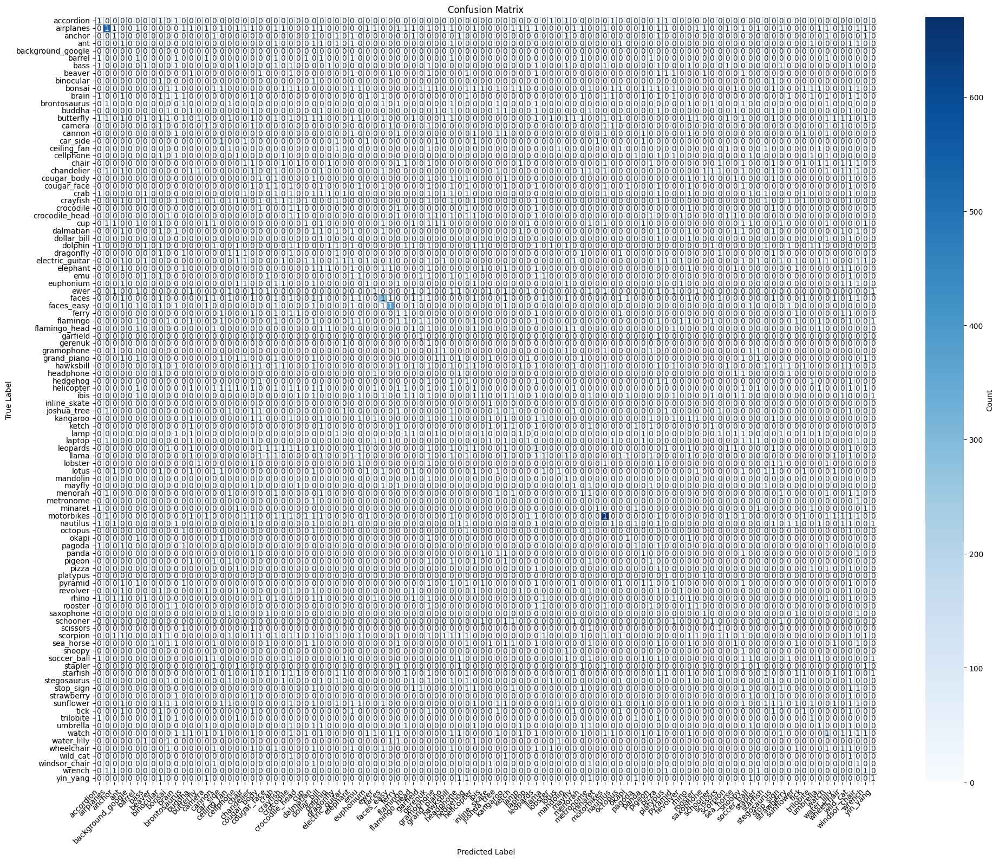

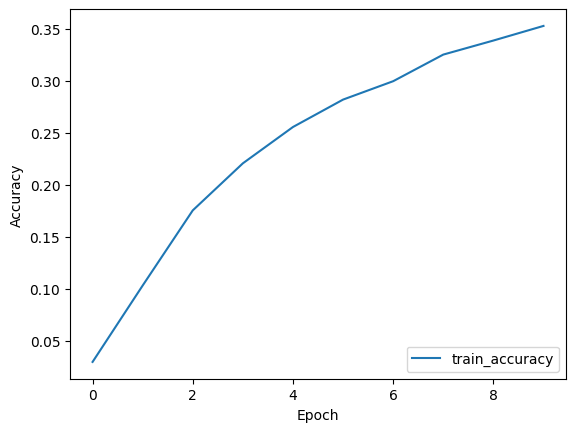

In [14]:

# model with dropout 0.2
def create_model():
    model = tf.keras.models.Sequential([
        tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 1)),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Conv2D(128, (3, 3), activation='relu'),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(128, activation='relu'),
        tf.keras.layers.Dropout(0.2),
        tf.keras.layers.Dense(len(class_names), activation='softmax')
    ])
    return model

model = create_model()
# larger learning rate
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = model.fit(train_data, epochs=10)

print_results()


Epoch 1/30


/opt/miniconda3/envs/ml/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


284/284 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - accuracy: 0.0243 - loss: 4.5519
Epoch 2/30


/opt/miniconda3/envs/ml/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


284/284 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - accuracy: 0.1330 - loss: 3.8406
Epoch 3/30
284/284 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - accuracy: 0.2254 - loss: 3.3631
Epoch 4/30
284/284 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - accuracy: 0.2708 - loss: 3.0651
Epoch 5/30
284/284 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - accuracy: 0.3302 - loss: 2.8025
Epoch 6/30


2024-11-01 21:16:58.165594: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


284/284 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - accuracy: 0.3585 - loss: 2.6345
Epoch 7/30
284/284 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - accuracy: 0.4005 - loss: 2.4834
Epoch 8/30
284/284 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - accuracy: 0.4210 - loss: 2.3618
Epoch 9/30
284/284 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - accuracy: 0.4492 - loss: 2.2551
Epoch 10/30
284/284 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - accuracy: 0.4768 - loss: 2.1245
Epoch 11/30
284/284 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - accuracy: 0.4910 - loss: 2.0755
Epoch 12/30
284/284 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - accuracy: 0.5062 - loss: 2.0098
Epoch 13/30
284/284 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - accuracy: 0.5084 - loss: 2.0048
Epoch 14/30
284/284 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - accuracy: 0.5211 - loss: 1.9598
Epoch 15/30
284/284 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - accuracy: 0.5408 - loss: 1.8900
Epoch 16/30
284/284 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - accuracy: 0.5375 - loss: 1.8985
Epoch 17/30
284/284 ━━━━━━━

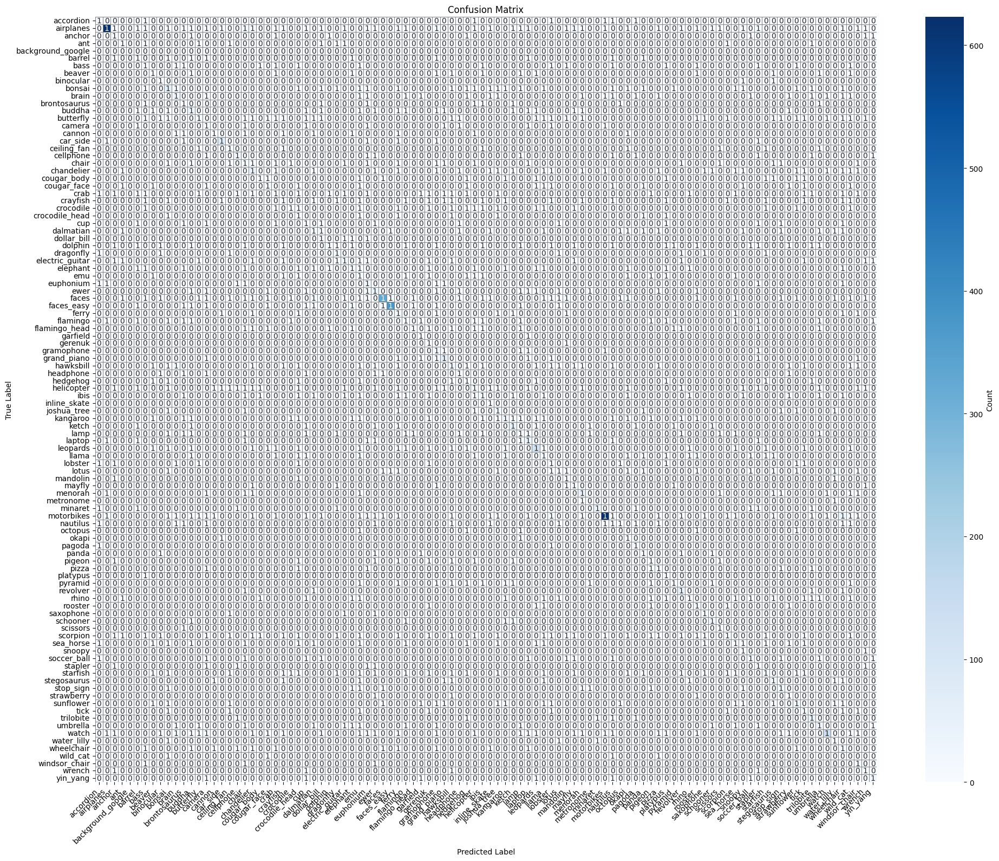

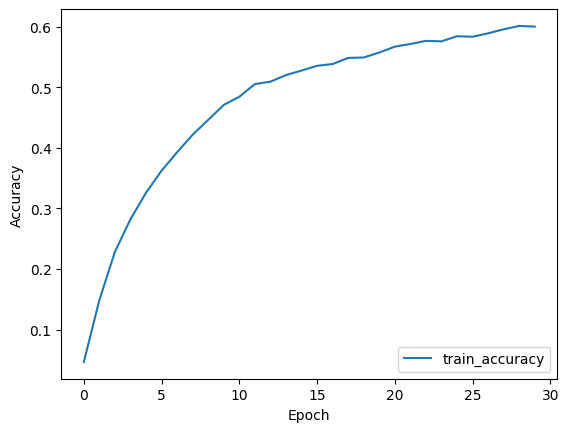

In [15]:

# model with dropout 0.2 + 30 epochs
def create_model():
    model = tf.keras.models.Sequential([
        tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 1)),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Conv2D(128, (3, 3), activation='relu'),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(128, activation='relu'),
        tf.keras.layers.Dropout(0.2),
        tf.keras.layers.Dense(len(class_names), activation='softmax')
    ])
    return model

model = create_model()
# larger learning rate
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = model.fit(train_data, epochs=30)

print_results()


Epoch 1/30


/opt/miniconda3/envs/ml/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


284/284 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - accuracy: 0.0212 - loss: 4.5640
Epoch 2/30


/opt/miniconda3/envs/ml/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


284/284 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - accuracy: 0.1647 - loss: 3.7168
Epoch 3/30
284/284 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - accuracy: 0.2800 - loss: 3.1154
Epoch 4/30
284/284 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - accuracy: 0.3532 - loss: 2.7362
Epoch 5/30
284/284 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - accuracy: 0.4289 - loss: 2.4252
Epoch 6/30
284/284 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - accuracy: 0.4742 - loss: 2.2027
Epoch 7/30
284/284 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - accuracy: 0.5123 - loss: 2.0565
Epoch 8/30
284/284 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - accuracy: 0.5392 - loss: 1.9267
Epoch 9/30
284/284 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - accuracy: 0.5621 - loss: 1.8058
Epoch 10/30
284/284 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - accuracy: 0.5883 - loss: 1.7365
Epoch 11/30
284/284 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - accuracy: 0.5862 - loss: 1.7164
Epoch 12/30
284/284 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - accuracy: 0.6099 - loss: 1.6054
Epoch 13/30
284/284 ━━━━━━━━━

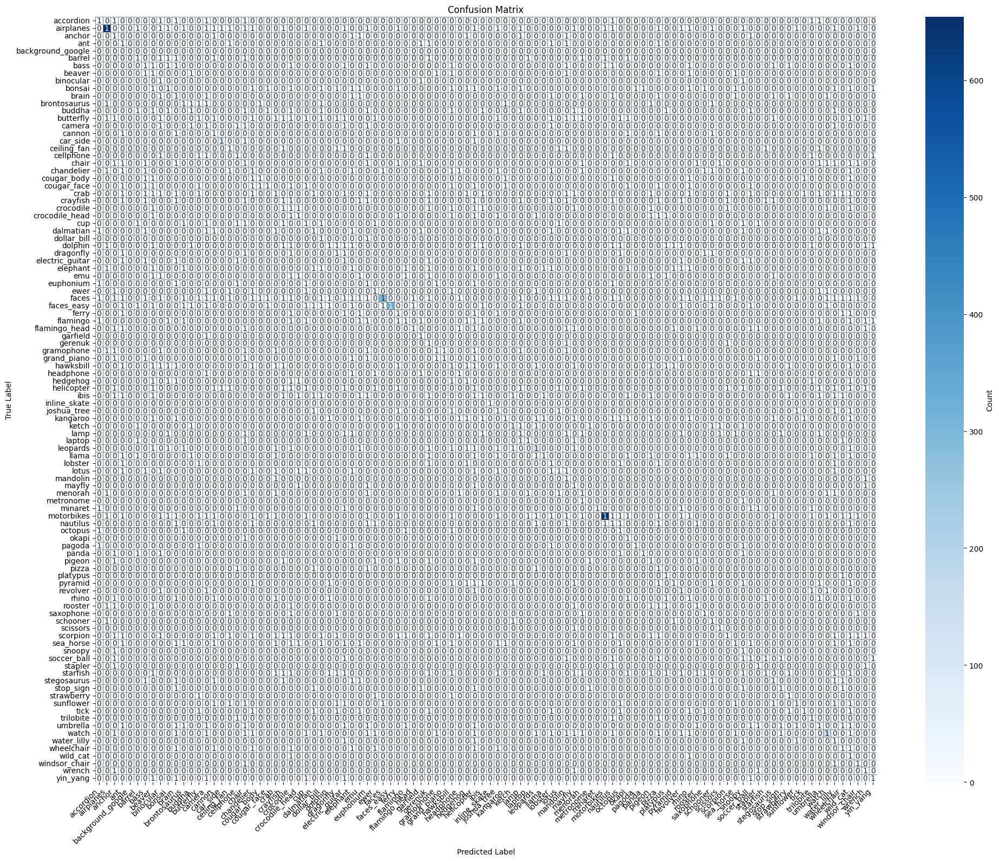

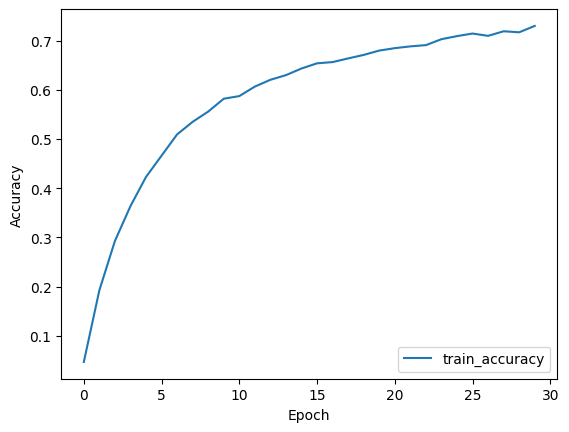

In [16]:
def create_model():
    
    model = tf.keras.models.Sequential()
    model.add(tf.keras.layers.Conv2D(32, (3, 3), activation='relu', 
                            input_shape=(128, 128, 1)))
    model.add(tf.keras.layers.MaxPooling2D((2, 2)))
    model.add(tf.keras.layers.Conv2D(64, (3, 3), activation='relu'))
    model.add(tf.keras.layers.MaxPooling2D((2, 2)))
    model.add(tf.keras.layers.Conv2D(128, (3, 3), activation='relu'))
    model.add(tf.keras.layers.MaxPooling2D((2, 2)))   

    model.add(tf.keras.layers.Flatten())
    model.add(tf.keras.layers.Dropout(0.5))
    model.add(tf.keras.layers.Dense(128, activation='relu'))
    model.add(tf.keras.layers.Dense(len(class_names), activation='softmax'))

    model.compile(optimizer='rmsprop',
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])    
    
    return model

model = create_model()
history = model.fit(train_data, epochs=30)

print_results()

Epoch 1/10


/opt/miniconda3/envs/ml/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


284/284 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - accuracy: 0.0119 - loss: 4.5981
Epoch 2/10


/opt/miniconda3/envs/ml/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


284/284 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - accuracy: 0.0739 - loss: 4.1387
Epoch 3/10
284/284 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - accuracy: 0.1854 - loss: 3.4751
Epoch 4/10
284/284 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - accuracy: 0.2831 - loss: 3.0193
Epoch 5/10
284/284 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - accuracy: 0.3617 - loss: 2.6085
Epoch 6/10
284/284 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - accuracy: 0.4480 - loss: 2.2178
Epoch 7/10
284/284 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - accuracy: 0.4979 - loss: 2.0227
Epoch 8/10


2024-11-01 21:57:09.651835: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


284/284 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - accuracy: 0.5374 - loss: 1.8356
Epoch 9/10
284/284 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - accuracy: 0.5744 - loss: 1.6286
Epoch 10/10
284/284 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - accuracy: 0.6131 - loss: 1.4788
176/176 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step
Accuracy: 63.05%


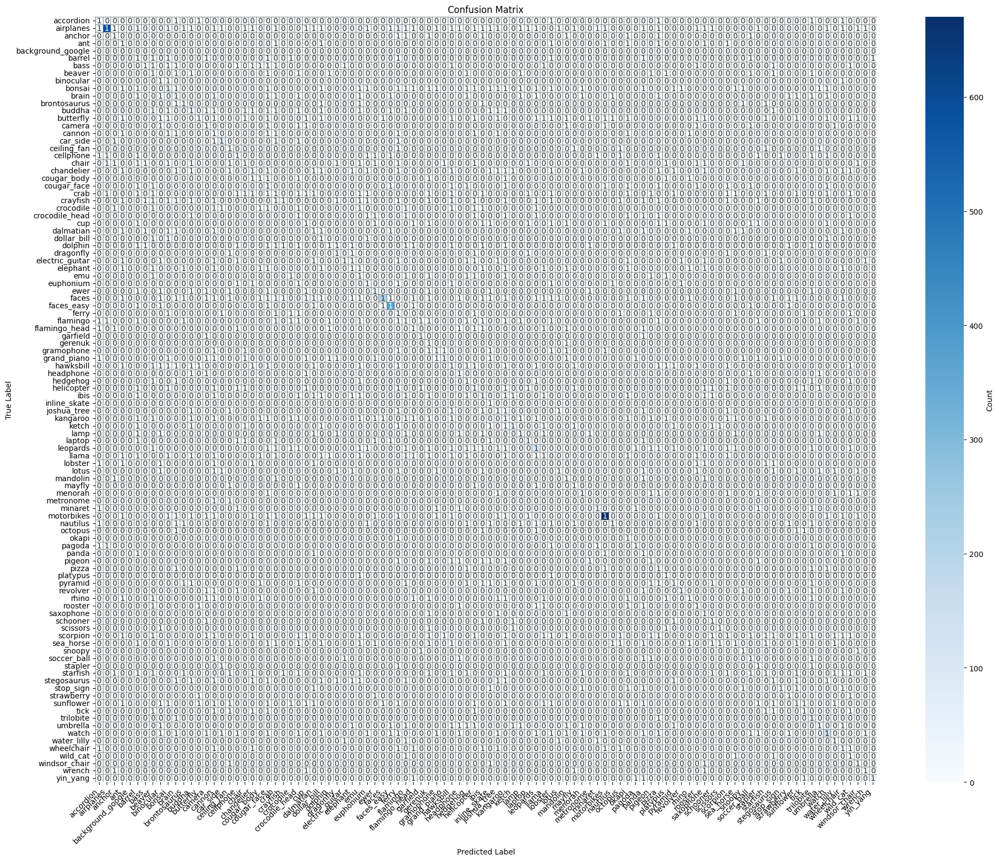

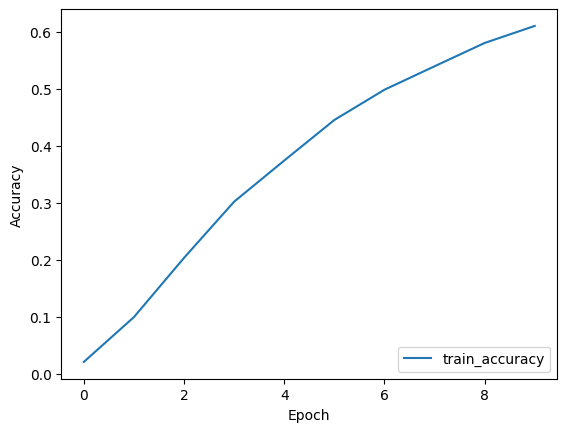

In [17]:
# model with more layers with more units

def create_model():
    model = tf.keras.models.Sequential([
        tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 1)),
        tf.keras.layers.MaxPooling2D((2, 2)),
    
        tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Conv2D(128, (3, 3), activation='relu'),
        tf.keras.layers.MaxPooling2D((2, 2)),        
        tf.keras.layers.Conv2D(256, (3, 3), activation='relu'),  # Increased depth and width
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Conv2D(512, (3, 3), activation='relu'),  # Increased depth and width
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(256, activation='relu'),  # Increased dense layer size
        tf.keras.layers.Dropout(0.1),  # Higher dropout to regularize
        
        tf.keras.layers.Dense(len(class_names), activation='softmax')
    ])
    return model

model = create_model()
# larger learning rate
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = model.fit(train_data, epochs=10)

print_results()

Epoch 1/10


/opt/miniconda3/envs/ml/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


284/284 ━━━━━━━━━━━━━━━━━━━━ 49s 137ms/step - accuracy: 0.0107 - loss: 4.6101
Epoch 2/10


/opt/miniconda3/envs/ml/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


284/284 ━━━━━━━━━━━━━━━━━━━━ 48s 135ms/step - accuracy: 0.0772 - loss: 4.0920
Epoch 3/10
284/284 ━━━━━━━━━━━━━━━━━━━━ 48s 137ms/step - accuracy: 0.2097 - loss: 3.3402
Epoch 4/10
284/284 ━━━━━━━━━━━━━━━━━━━━ 48s 135ms/step - accuracy: 0.3157 - loss: 2.7798
Epoch 5/10
284/284 ━━━━━━━━━━━━━━━━━━━━ 48s 137ms/step - accuracy: 0.4121 - loss: 2.3703
Epoch 6/10
284/284 ━━━━━━━━━━━━━━━━━━━━ 48s 136ms/step - accuracy: 0.4724 - loss: 2.0808
Epoch 7/10
284/284 ━━━━━━━━━━━━━━━━━━━━ 82s 137ms/step - accuracy: 0.5223 - loss: 1.8404
Epoch 8/10
284/284 ━━━━━━━━━━━━━━━━━━━━ 48s 136ms/step - accuracy: 0.5826 - loss: 1.5865
Epoch 9/10
284/284 ━━━━━━━━━━━━━━━━━━━━ 48s 136ms/step - accuracy: 0.6261 - loss: 1.4300
Epoch 10/10
284/284 ━━━━━━━━━━━━━━━━━━━━ 48s 137ms/step - accuracy: 0.6413 - loss: 1.3493
176/176 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step
Accuracy: 62.91%


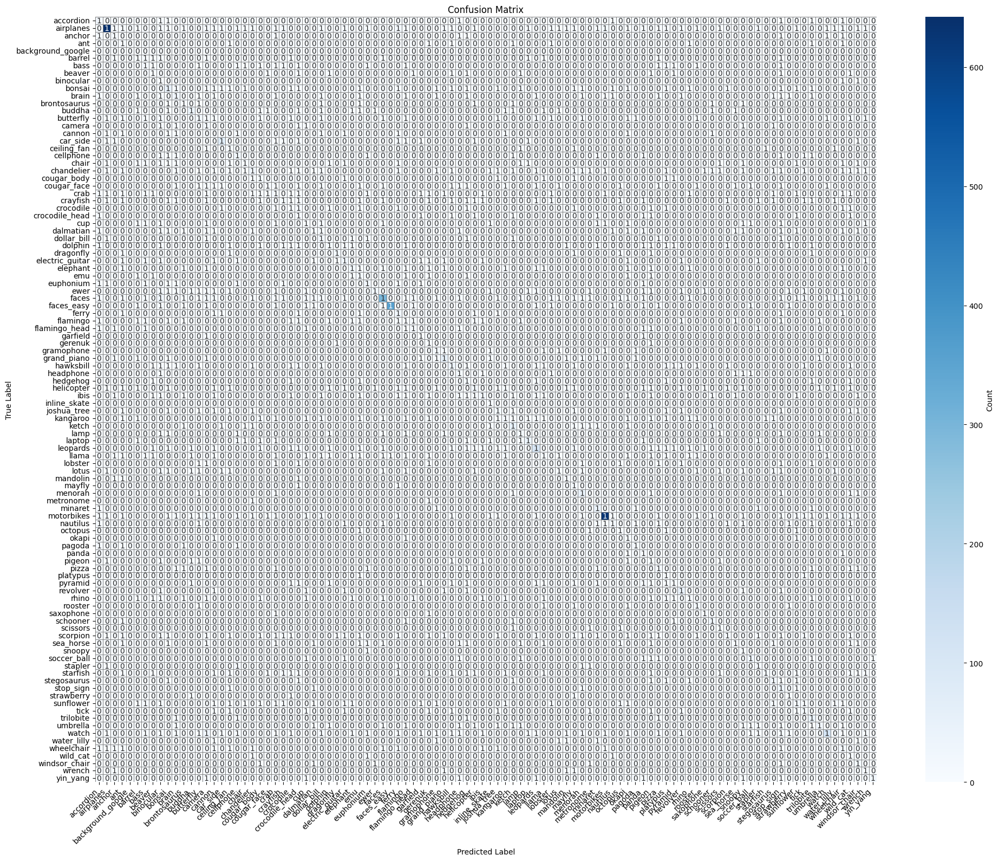

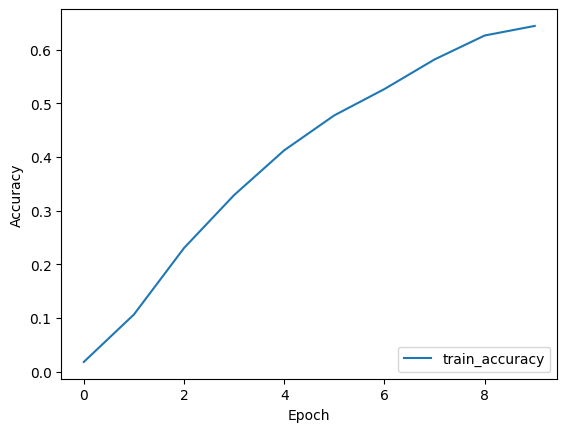

In [18]:
# model with more dropout and more layers with more units

def create_model():
    model = tf.keras.models.Sequential([
        tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 1)),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Dropout(0.05),
        
        tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Dropout(0.05),
        
        tf.keras.layers.Conv2D(128, (3, 3), activation='relu'),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Dropout(0.05),
        
        tf.keras.layers.Conv2D(256, (3, 3), activation='relu'),  # Increased depth and width
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Dropout(0.05),

        tf.keras.layers.Conv2D(512, (3, 3), activation='relu'),  # Increased depth and width
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Dropout(0.05),
        
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(1024, activation='relu'),  # Increased dense layer size
        tf.keras.layers.Dropout(0.1),  # Higher dropout to regularize
        
        tf.keras.layers.Dense(len(class_names), activation='softmax')
    ])
    return model

model = create_model()
# larger learning rate
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = model.fit(train_data, epochs=10)

print_results()

Epoch 1/10


/opt/miniconda3/envs/ml/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


284/284 ━━━━━━━━━━━━━━━━━━━━ 24s 49ms/step - accuracy: 0.0173 - loss: 4.5800
Epoch 2/10


/opt/miniconda3/envs/ml/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


284/284 ━━━━━━━━━━━━━━━━━━━━ 22s 46ms/step - accuracy: 0.1176 - loss: 3.9394
Epoch 3/10
284/284 ━━━━━━━━━━━━━━━━━━━━ 22s 47ms/step - accuracy: 0.1984 - loss: 3.4467
Epoch 4/10
284/284 ━━━━━━━━━━━━━━━━━━━━ 22s 47ms/step - accuracy: 0.2637 - loss: 3.0993
Epoch 5/10
284/284 ━━━━━━━━━━━━━━━━━━━━ 22s 47ms/step - accuracy: 0.3231 - loss: 2.8287
Epoch 6/10
284/284 ━━━━━━━━━━━━━━━━━━━━ 22s 46ms/step - accuracy: 0.3625 - loss: 2.6150
Epoch 7/10
284/284 ━━━━━━━━━━━━━━━━━━━━ 22s 46ms/step - accuracy: 0.3951 - loss: 2.5068
Epoch 8/10
284/284 ━━━━━━━━━━━━━━━━━━━━ 22s 47ms/step - accuracy: 0.4188 - loss: 2.3960
Epoch 9/10
284/284 ━━━━━━━━━━━━━━━━━━━━ 22s 46ms/step - accuracy: 0.4404 - loss: 2.2601
Epoch 10/10
284/284 ━━━━━━━━━━━━━━━━━━━━ 22s 47ms/step - accuracy: 0.4526 - loss: 2.1837
176/176 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step
Accuracy: 61.75%


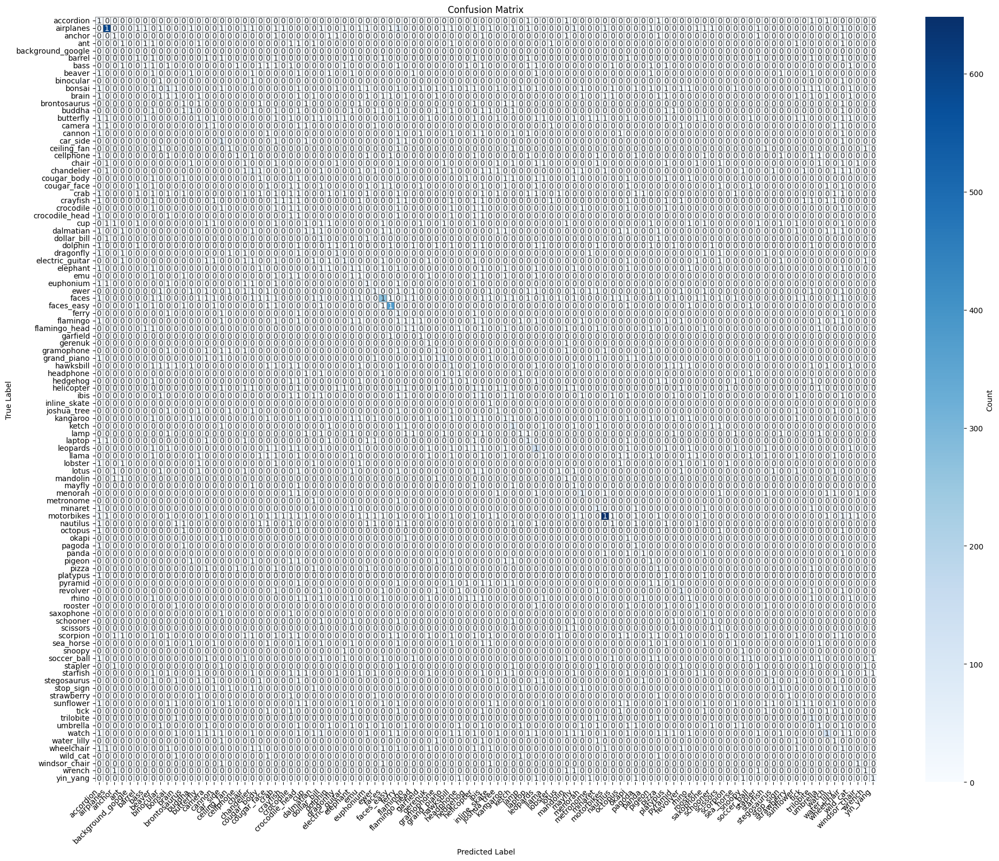

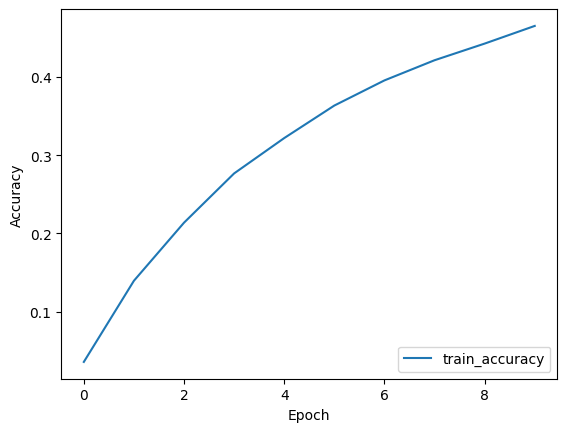

In [19]:

# model with dropout 0.2 and pooling 3x3
def create_model():
    model = tf.keras.models.Sequential([
        tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 1)),
        tf.keras.layers.MaxPooling2D((3, 3)),
        tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
        tf.keras.layers.MaxPooling2D((3, 3)),
        tf.keras.layers.Conv2D(128, (3, 3), activation='relu'),
        tf.keras.layers.MaxPooling2D((3, 3)),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(128, activation='relu'),
        tf.keras.layers.Dropout(0.2),
        tf.keras.layers.Dense(len(class_names), activation='softmax')
    ])
    return model

model = create_model()
# larger learning rate
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = model.fit(train_data, epochs=10)

print_results()


Epoch 1/20


/opt/miniconda3/envs/ml/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


284/284 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - accuracy: 0.0210 - loss: 4.5616
Epoch 2/20


/opt/miniconda3/envs/ml/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


284/284 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - accuracy: 0.1772 - loss: 3.6405
Epoch 3/20
284/284 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - accuracy: 0.2713 - loss: 3.1157
Epoch 4/20
284/284 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - accuracy: 0.3485 - loss: 2.7205
Epoch 5/20
284/284 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - accuracy: 0.3915 - loss: 2.5364
Epoch 6/20
284/284 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - accuracy: 0.4359 - loss: 2.3390
Epoch 7/20
284/284 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - accuracy: 0.4615 - loss: 2.2523
Epoch 8/20
284/284 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - accuracy: 0.5015 - loss: 2.0735
Epoch 9/20
284/284 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - accuracy: 0.5074 - loss: 2.0434
Epoch 10/20
284/284 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - accuracy: 0.5306 - loss: 1.9296
Epoch 11/20
284/284 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - accuracy: 0.5330 - loss: 1.9076
Epoch 12/20
284/284 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - accuracy: 0.5554 - loss: 1.8114
Epoch 13/20
284/284 ━━━━━━━━━━

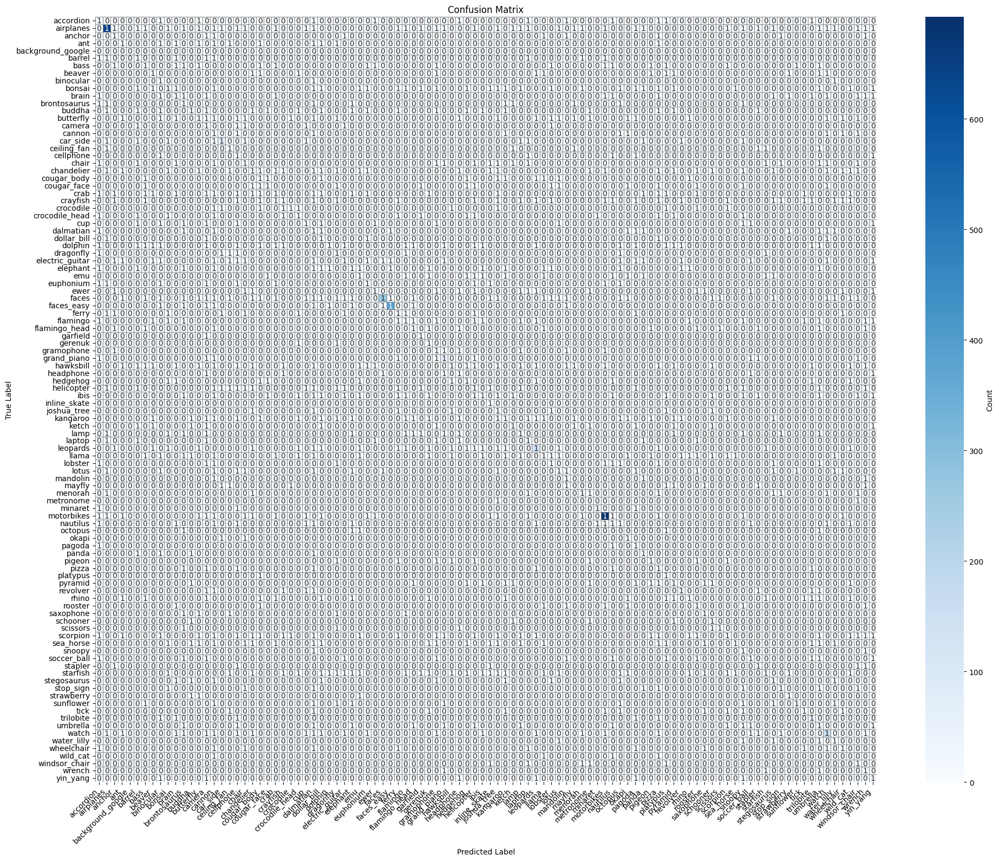

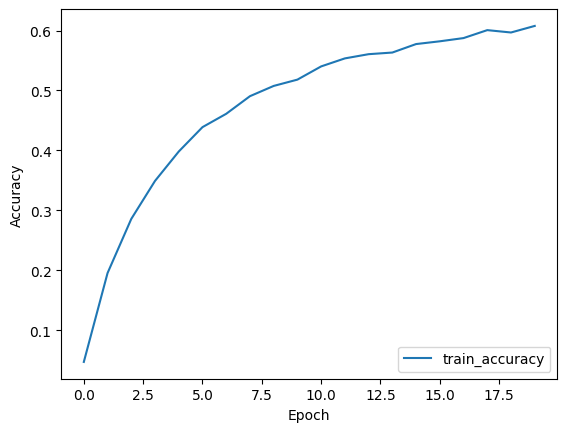

In [20]:

# model with dropout 0.2 and more epochs
def create_model():
    model = tf.keras.models.Sequential([
        tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 1)),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Conv2D(128, (3, 3), activation='relu'),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(128, activation='relu'),
        tf.keras.layers.Dropout(0.2),
        tf.keras.layers.Dense(len(class_names), activation='softmax')
    ])
    return model

model = create_model()
# larger learning rate
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = model.fit(train_data, epochs=20)

print_results()


Epoch 1/20


/opt/miniconda3/envs/ml/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


284/284 ━━━━━━━━━━━━━━━━━━━━ 23s 47ms/step - accuracy: 0.0162 - loss: 4.5795
Epoch 2/20


/opt/miniconda3/envs/ml/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


284/284 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step - accuracy: 0.1081 - loss: 3.9806
Epoch 3/20
284/284 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step - accuracy: 0.1856 - loss: 3.5162
Epoch 4/20
284/284 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.2521 - loss: 3.1784
Epoch 5/20
284/284 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step - accuracy: 0.2982 - loss: 2.9338
Epoch 6/20
284/284 ━━━━━━━━━━━━━━━━━━━━ 23s 47ms/step - accuracy: 0.3432 - loss: 2.7517
Epoch 7/20
284/284 ━━━━━━━━━━━━━━━━━━━━ 23s 47ms/step - accuracy: 0.3755 - loss: 2.5318
Epoch 8/20
284/284 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step - accuracy: 0.4107 - loss: 2.3954
Epoch 9/20
284/284 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step - accuracy: 0.4213 - loss: 2.3692
Epoch 10/20
284/284 ━━━━━━━━━━━━━━━━━━━━ 23s 47ms/step - accuracy: 0.4376 - loss: 2.2810
Epoch 11/20
284/284 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step - accuracy: 0.4639 - loss: 2.1448
Epoch 12/20
284/284 ━━━━━━━━━━━━━━━━━━━━ 23s 47ms/step - accuracy: 0.4763 - loss: 2.1022
Epoch 13/20
284/284 ━━━━━━━━━━━━━━━━━━━━

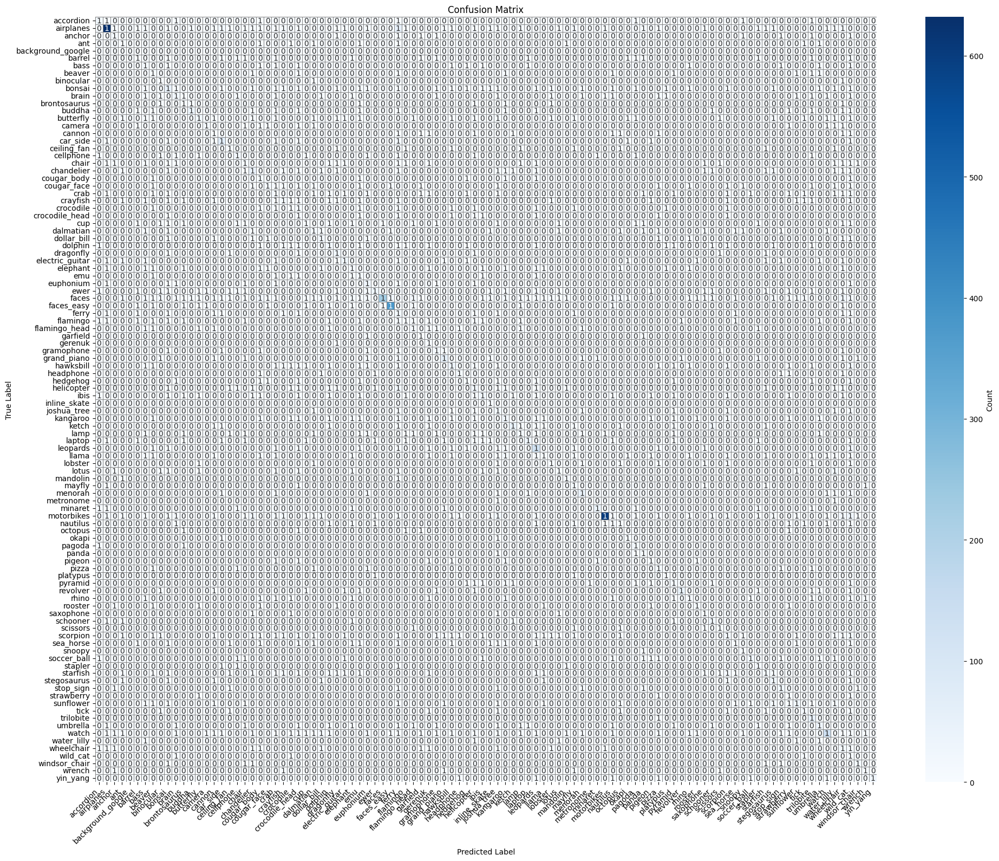

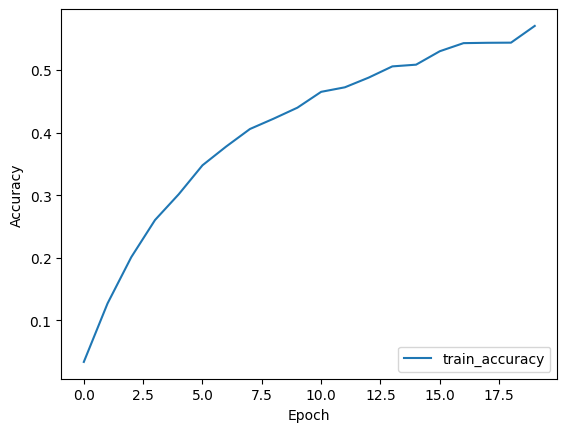

In [21]:
# model with dropout 0.2 and pooling 3x3 and more epochs
def create_model():
    model = tf.keras.models.Sequential([
        tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 1)),
        tf.keras.layers.MaxPooling2D((3, 3)),
        tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
        tf.keras.layers.MaxPooling2D((3, 3)),
        tf.keras.layers.Conv2D(128, (3, 3), activation='relu'),
        tf.keras.layers.MaxPooling2D((3, 3)),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(128, activation='relu'),
        tf.keras.layers.Dropout(0.2),
        tf.keras.layers.Dense(len(class_names), activation='softmax')
    ])
    return model

model = create_model()
# larger learning rate
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = model.fit(train_data, epochs=20)

print_results()

Epoch 1/20


/opt/miniconda3/envs/ml/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


284/284 ━━━━━━━━━━━━━━━━━━━━ 67s 196ms/step - accuracy: 0.0495 - loss: 4.8007
Epoch 2/20


/opt/miniconda3/envs/ml/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


284/284 ━━━━━━━━━━━━━━━━━━━━ 65s 196ms/step - accuracy: 0.1694 - loss: 3.6844
Epoch 3/20
284/284 ━━━━━━━━━━━━━━━━━━━━ 65s 195ms/step - accuracy: 0.2696 - loss: 3.1543
Epoch 4/20
284/284 ━━━━━━━━━━━━━━━━━━━━ 65s 195ms/step - accuracy: 0.3322 - loss: 2.8110
Epoch 5/20
284/284 ━━━━━━━━━━━━━━━━━━━━ 64s 194ms/step - accuracy: 0.3760 - loss: 2.5883
Epoch 6/20
284/284 ━━━━━━━━━━━━━━━━━━━━ 65s 196ms/step - accuracy: 0.4342 - loss: 2.3233
Epoch 7/20
284/284 ━━━━━━━━━━━━━━━━━━━━ 64s 194ms/step - accuracy: 0.4545 - loss: 2.2393
Epoch 8/20
284/284 ━━━━━━━━━━━━━━━━━━━━ 65s 196ms/step - accuracy: 0.5160 - loss: 1.9998
Epoch 9/20
284/284 ━━━━━━━━━━━━━━━━━━━━ 64s 194ms/step - accuracy: 0.5358 - loss: 1.8754
Epoch 10/20
284/284 ━━━━━━━━━━━━━━━━━━━━ 64s 194ms/step - accuracy: 0.5727 - loss: 1.7425
Epoch 11/20
284/284 ━━━━━━━━━━━━━━━━━━━━ 65s 195ms/step - accuracy: 0.5851 - loss: 1.6501
Epoch 12/20
284/284 ━━━━━━━━━━━━━━━━━━━━ 64s 194ms/step - accuracy: 0.6169 - loss: 1.5491
Epoch 13/20
284/284 ━━━━━━━━━

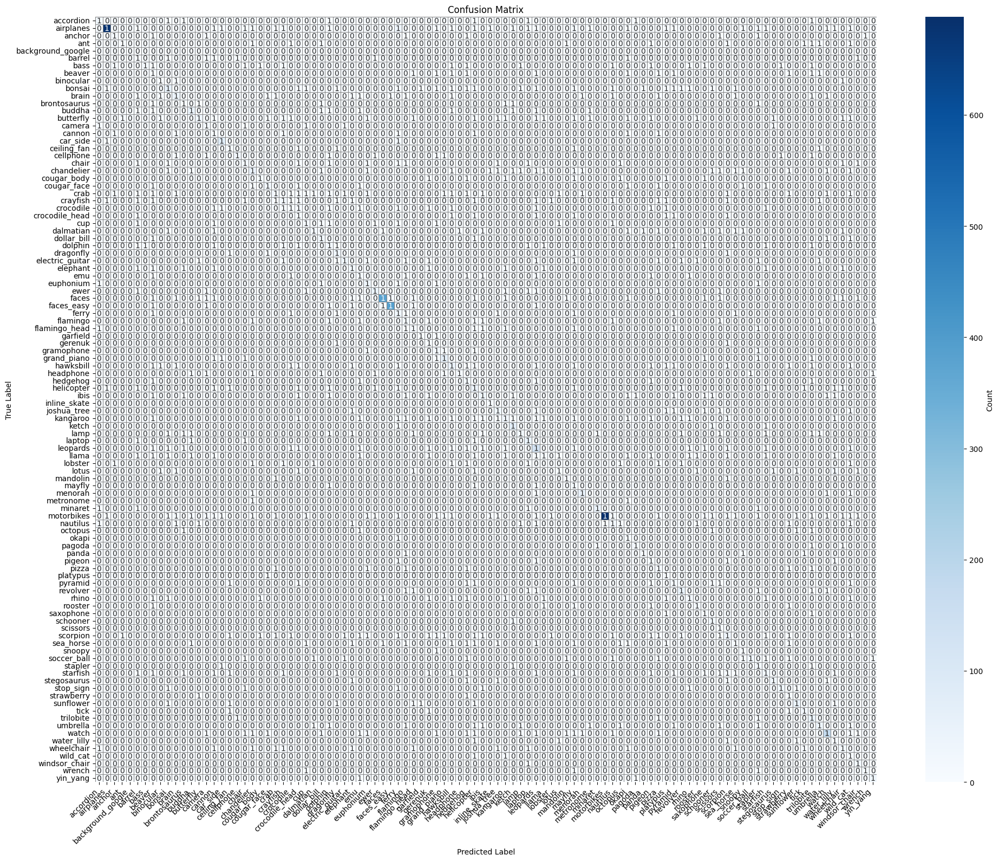

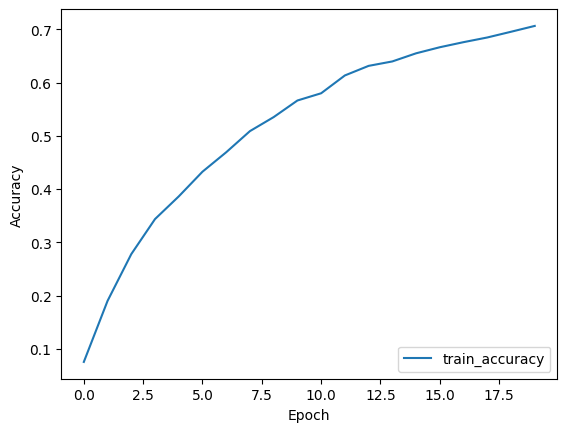

In [22]:
def create_model():
    model = tf.keras.models.Sequential([
        tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 1)),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Dropout(0.25),

        tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Dropout(0.25),

        tf.keras.layers.Conv2D(128, (3, 3), activation='relu'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Dropout(0.3),

        tf.keras.layers.Conv2D(256, (3, 3), activation='relu'),  # Additional layer
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Dropout(0.3),

        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(256, activation='relu'),  # Increased dense layer size
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Dropout(0.4),  # Higher dropout to regularize

        tf.keras.layers.Dense(len(class_names), activation='softmax')
    ])
    return model

# Compile with a lower learning rate
model = create_model()
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0005), 
              loss='sparse_categorical_crossentropy', 
              metrics=['accuracy'])

history = model.fit(train_data, epochs=20)

print_results()


Epoch 1/20


/opt/miniconda3/envs/ml/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


284/284 ━━━━━━━━━━━━━━━━━━━━ 70s 209ms/step - accuracy: 0.0304 - loss: 4.5312
Epoch 2/20


/opt/miniconda3/envs/ml/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


284/284 ━━━━━━━━━━━━━━━━━━━━ 69s 209ms/step - accuracy: 0.2187 - loss: 3.4129
Epoch 3/20
284/284 ━━━━━━━━━━━━━━━━━━━━ 69s 210ms/step - accuracy: 0.3504 - loss: 2.7959
Epoch 4/20
284/284 ━━━━━━━━━━━━━━━━━━━━ 69s 210ms/step - accuracy: 0.4215 - loss: 2.4389
Epoch 5/20
284/284 ━━━━━━━━━━━━━━━━━━━━ 69s 208ms/step - accuracy: 0.4764 - loss: 2.1870
Epoch 6/20
284/284 ━━━━━━━━━━━━━━━━━━━━ 72s 221ms/step - accuracy: 0.5125 - loss: 2.0403
Epoch 7/20
284/284 ━━━━━━━━━━━━━━━━━━━━ 69s 209ms/step - accuracy: 0.5350 - loss: 1.9090
Epoch 8/20
284/284 ━━━━━━━━━━━━━━━━━━━━ 69s 209ms/step - accuracy: 0.5554 - loss: 1.8566
Epoch 9/20
284/284 ━━━━━━━━━━━━━━━━━━━━ 68s 207ms/step - accuracy: 0.5504 - loss: 1.8471
Epoch 10/20
284/284 ━━━━━━━━━━━━━━━━━━━━ 69s 209ms/step - accuracy: 0.5799 - loss: 1.7028
Epoch 11/20
284/284 ━━━━━━━━━━━━━━━━━━━━ 68s 208ms/step - accuracy: 0.5882 - loss: 1.6948
Epoch 12/20
284/284 ━━━━━━━━━━━━━━━━━━━━ 69s 210ms/step - accuracy: 0.6060 - loss: 1.5796
Epoch 13/20
284/284 ━━━━━━━━━

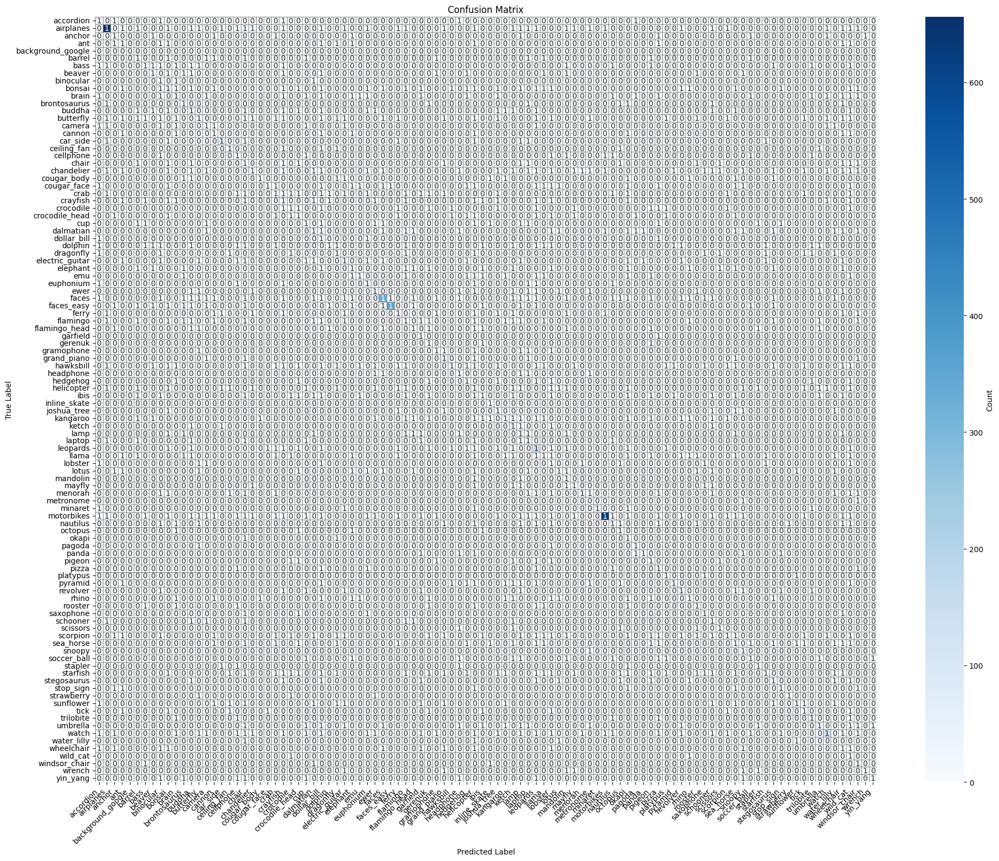

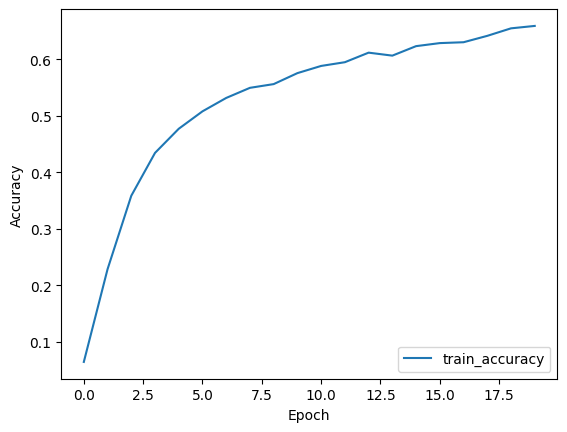

In [23]:
def create_model():
    model = tf.keras.models.Sequential([
        tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 1)),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
        tf.keras.layers.Conv2D(128, (3, 3), activation='relu'),
        tf.keras.layers.MaxPooling2D((2, 2)),
        
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(256, activation='relu'),  # Reduced dense layer size
        tf.keras.layers.Dropout(0.1),  # Increased dropout rate
        tf.keras.layers.Dense(len(class_names), activation='softmax')
    ])
    return model


lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=0.001,
    decay_steps=10000,
    decay_rate=0.9)


model = create_model()
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=lr_schedule), 
              loss='sparse_categorical_crossentropy', 
              metrics=['accuracy'])

history = model.fit(train_data, epochs=20)

print_results()

Epoch 1/20


/opt/miniconda3/envs/ml/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


284/284 ━━━━━━━━━━━━━━━━━━━━ 70s 210ms/step - accuracy: 0.0252 - loss: 4.5918
Epoch 2/20


/opt/miniconda3/envs/ml/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


284/284 ━━━━━━━━━━━━━━━━━━━━ 68s 207ms/step - accuracy: 0.2177 - loss: 3.5134
Epoch 3/20
284/284 ━━━━━━━━━━━━━━━━━━━━ 68s 208ms/step - accuracy: 0.3464 - loss: 2.8428
Epoch 4/20
284/284 ━━━━━━━━━━━━━━━━━━━━ 68s 208ms/step - accuracy: 0.4197 - loss: 2.5368
Epoch 5/20
284/284 ━━━━━━━━━━━━━━━━━━━━ 69s 209ms/step - accuracy: 0.4670 - loss: 2.3220
Epoch 6/20
284/284 ━━━━━━━━━━━━━━━━━━━━ 68s 207ms/step - accuracy: 0.4930 - loss: 2.2004
Epoch 7/20
284/284 ━━━━━━━━━━━━━━━━━━━━ 69s 209ms/step - accuracy: 0.4964 - loss: 2.1329
Epoch 8/20
284/284 ━━━━━━━━━━━━━━━━━━━━ 68s 208ms/step - accuracy: 0.5234 - loss: 2.0454
Epoch 9/20
284/284 ━━━━━━━━━━━━━━━━━━━━ 68s 208ms/step - accuracy: 0.5363 - loss: 1.9565
Epoch 10/20
284/284 ━━━━━━━━━━━━━━━━━━━━ 69s 209ms/step - accuracy: 0.5438 - loss: 1.9166
Epoch 11/20
284/284 ━━━━━━━━━━━━━━━━━━━━ 69s 210ms/step - accuracy: 0.5433 - loss: 1.8901
Epoch 12/20
284/284 ━━━━━━━━━━━━━━━━━━━━ 68s 208ms/step - accuracy: 0.5611 - loss: 1.8450
Epoch 13/20
284/284 ━━━━━━━━━

2024-11-01 23:38:23.148564: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


284/284 ━━━━━━━━━━━━━━━━━━━━ 68s 208ms/step - accuracy: 0.6038 - loss: 1.5858
Epoch 20/20
284/284 ━━━━━━━━━━━━━━━━━━━━ 68s 207ms/step - accuracy: 0.6267 - loss: 1.4754
176/176 ━━━━━━━━━━━━━━━━━━━━ 10s 56ms/step
Accuracy: 59.82%


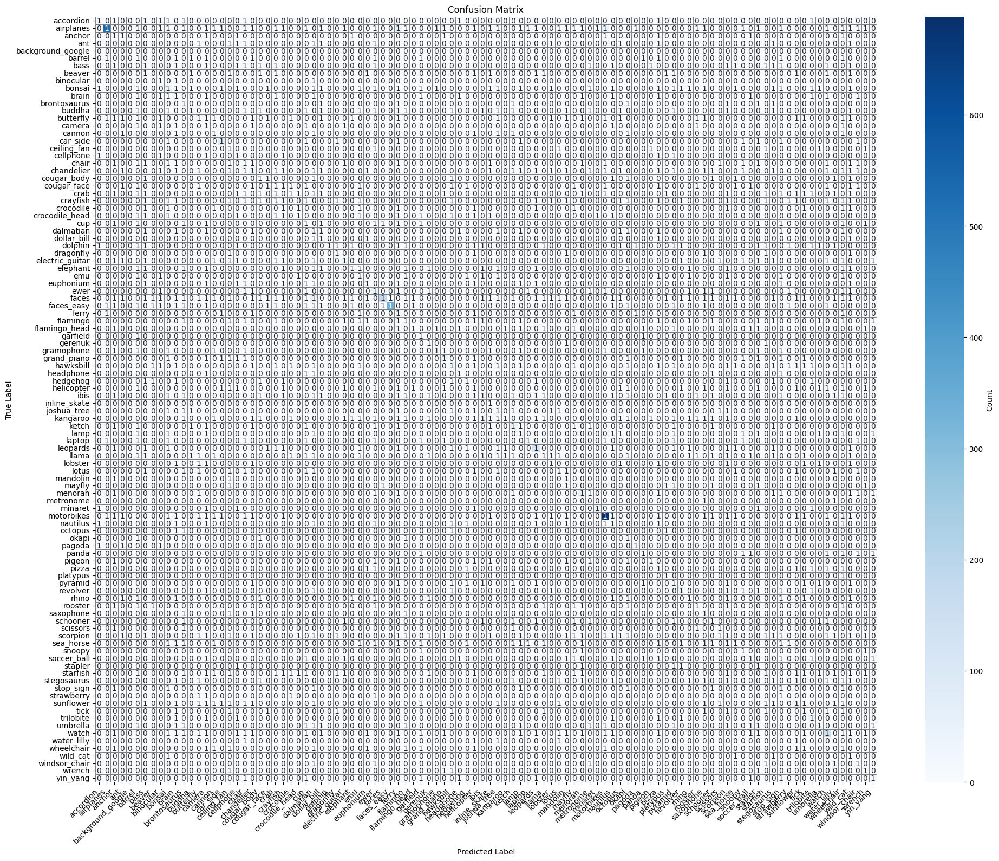

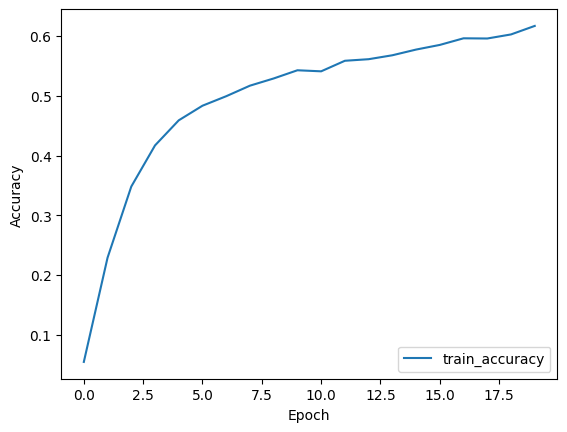

In [24]:
def create_model():
    model = tf.keras.models.Sequential([
        tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 1)),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
        tf.keras.layers.Conv2D(128, (3, 3), activation='relu'),
        tf.keras.layers.MaxPooling2D((2, 2)),
        
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(256, activation='relu'),  # Reduced dense layer size
        tf.keras.layers.Dropout(0.1),  # Increased dropout rate
        tf.keras.layers.Dense(len(class_names), activation='softmax')
    ])
    return model


lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=0.001,
    decay_steps=10000,
    decay_rate=0.9)


model = create_model()
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=lr_schedule), 
              loss='sparse_categorical_crossentropy', 
              metrics=['accuracy'])

history = model.fit(train_data, epochs=20)

print_results()

Epoch 1/20


/opt/miniconda3/envs/ml/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


284/284 ━━━━━━━━━━━━━━━━━━━━ 62s 180ms/step - accuracy: 0.0159 - loss: 4.7115
Epoch 2/20


/opt/miniconda3/envs/ml/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


284/284 ━━━━━━━━━━━━━━━━━━━━ 60s 179ms/step - accuracy: 0.0440 - loss: 4.3371
Epoch 3/20
284/284 ━━━━━━━━━━━━━━━━━━━━ 60s 179ms/step - accuracy: 0.0717 - loss: 4.1625
Epoch 4/20
284/284 ━━━━━━━━━━━━━━━━━━━━ 60s 179ms/step - accuracy: 0.0907 - loss: 3.9791
Epoch 5/20
284/284 ━━━━━━━━━━━━━━━━━━━━ 60s 178ms/step - accuracy: 0.1044 - loss: 3.8651
Epoch 6/20
284/284 ━━━━━━━━━━━━━━━━━━━━ 60s 178ms/step - accuracy: 0.1395 - loss: 3.7165
Epoch 7/20
284/284 ━━━━━━━━━━━━━━━━━━━━ 60s 180ms/step - accuracy: 0.1547 - loss: 3.5984
Epoch 8/20
284/284 ━━━━━━━━━━━━━━━━━━━━ 60s 179ms/step - accuracy: 0.1739 - loss: 3.4551
Epoch 9/20
284/284 ━━━━━━━━━━━━━━━━━━━━ 60s 177ms/step - accuracy: 0.1941 - loss: 3.3619
Epoch 10/20
284/284 ━━━━━━━━━━━━━━━━━━━━ 60s 178ms/step - accuracy: 0.2125 - loss: 3.2571
Epoch 11/20
284/284 ━━━━━━━━━━━━━━━━━━━━ 60s 180ms/step - accuracy: 0.2333 - loss: 3.1523
Epoch 12/20
284/284 ━━━━━━━━━━━━━━━━━━━━ 60s 177ms/step - accuracy: 0.2566 - loss: 3.0322
Epoch 13/20
284/284 ━━━━━━━━━

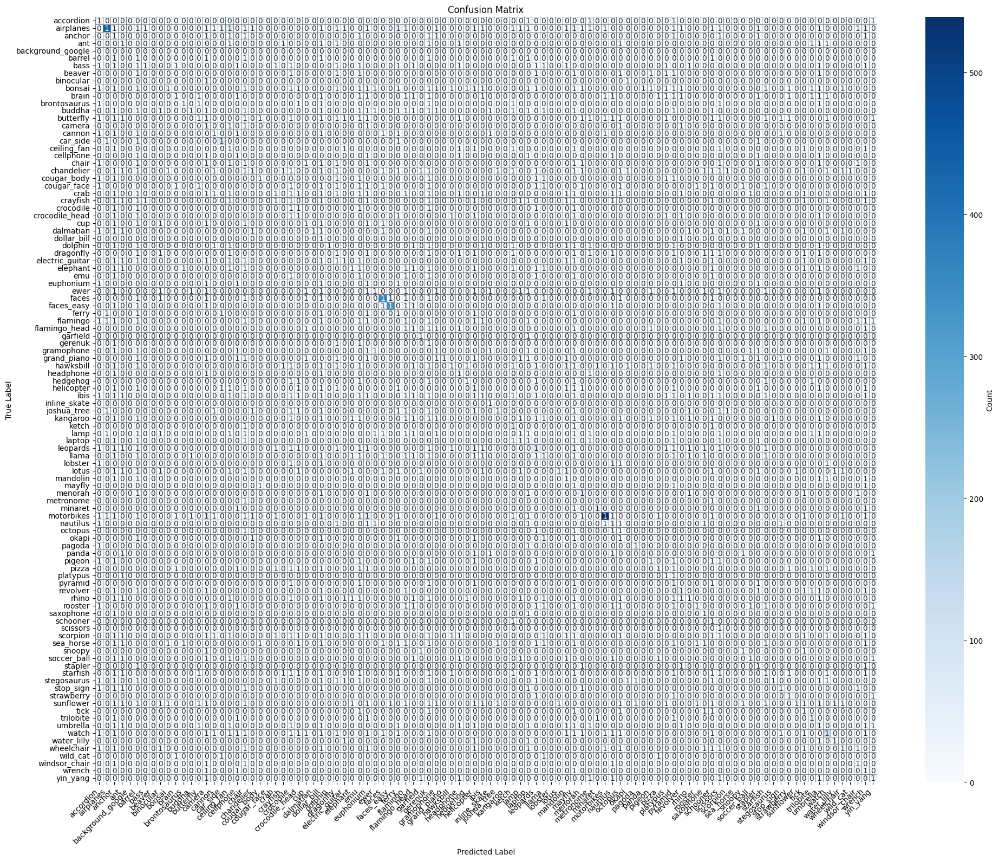

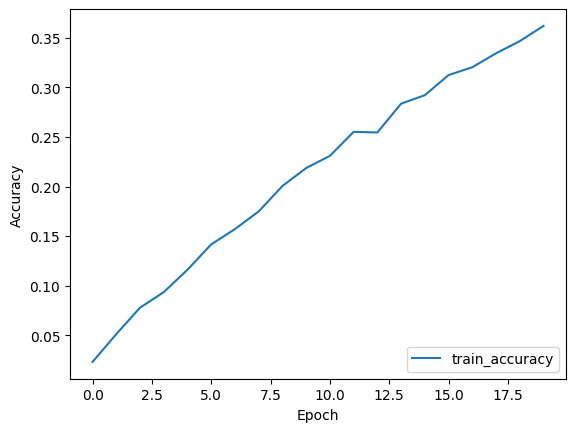

In [25]:
def create_improved_model():
    model = tf.keras.models.Sequential([
        # First Convolutional Block
        tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 1)),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Dropout(0.3),  # Regularization

        # Second Convolutional Block
        tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Dropout(0.3),

        # Third Convolutional Block
        tf.keras.layers.Conv2D(128, (3, 3), activation='relu'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Dropout(0.4),

        # Fourth Convolutional Block for Deeper Feature Extraction
        tf.keras.layers.Conv2D(256, (3, 3), activation='relu'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Dropout(0.4),

        # Global Average Pooling instead of Flattening
        tf.keras.layers.GlobalAveragePooling2D(),

        # Fully Connected Layer
        tf.keras.layers.Dense(128, activation='relu'),
        tf.keras.layers.Dropout(0.5),  # Dropout for Dense layer

        # Output Layer
        tf.keras.layers.Dense(len(class_names), activation='softmax')
    ])
    return model

lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=0.0005,
    decay_steps=10000,
    decay_rate=0.9)

# Instantiate and compile the improved model
model = create_improved_model()
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=lr_schedule),  # Reduced learning rate for stability
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

# Training the model
history = model.fit(train_data, epochs=20)
print_results()

Epoch 1/35


/opt/miniconda3/envs/ml/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


284/284 ━━━━━━━━━━━━━━━━━━━━ 68s 201ms/step - accuracy: 0.0251 - loss: 5.3249
Epoch 2/35


/opt/miniconda3/envs/ml/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


284/284 ━━━━━━━━━━━━━━━━━━━━ 66s 200ms/step - accuracy: 0.0747 - loss: 4.3895
Epoch 3/35
284/284 ━━━━━━━━━━━━━━━━━━━━ 66s 200ms/step - accuracy: 0.1396 - loss: 3.8569
Epoch 4/35
284/284 ━━━━━━━━━━━━━━━━━━━━ 66s 202ms/step - accuracy: 0.1904 - loss: 3.5139
Epoch 5/35
284/284 ━━━━━━━━━━━━━━━━━━━━ 66s 199ms/step - accuracy: 0.2474 - loss: 3.1926
Epoch 6/35
284/284 ━━━━━━━━━━━━━━━━━━━━ 66s 200ms/step - accuracy: 0.3028 - loss: 2.9116
Epoch 7/35
284/284 ━━━━━━━━━━━━━━━━━━━━ 66s 200ms/step - accuracy: 0.3439 - loss: 2.6950
Epoch 8/35
284/284 ━━━━━━━━━━━━━━━━━━━━ 66s 201ms/step - accuracy: 0.3906 - loss: 2.5026
Epoch 9/35
284/284 ━━━━━━━━━━━━━━━━━━━━ 66s 200ms/step - accuracy: 0.4216 - loss: 2.3426
Epoch 10/35
284/284 ━━━━━━━━━━━━━━━━━━━━ 66s 200ms/step - accuracy: 0.4517 - loss: 2.2084
Epoch 11/35
284/284 ━━━━━━━━━━━━━━━━━━━━ 66s 200ms/step - accuracy: 0.4985 - loss: 2.0311
Epoch 12/35
284/284 ━━━━━━━━━━━━━━━━━━━━ 66s 199ms/step - accuracy: 0.5005 - loss: 1.9685
Epoch 13/35
284/284 ━━━━━━━━━

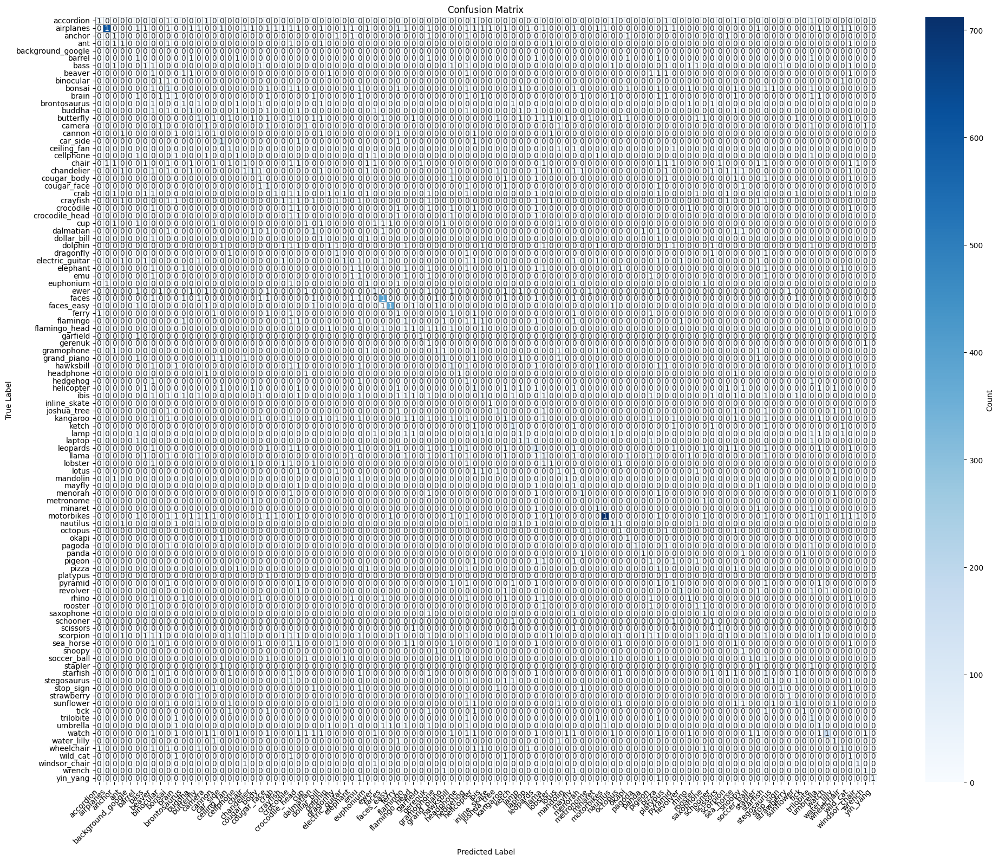

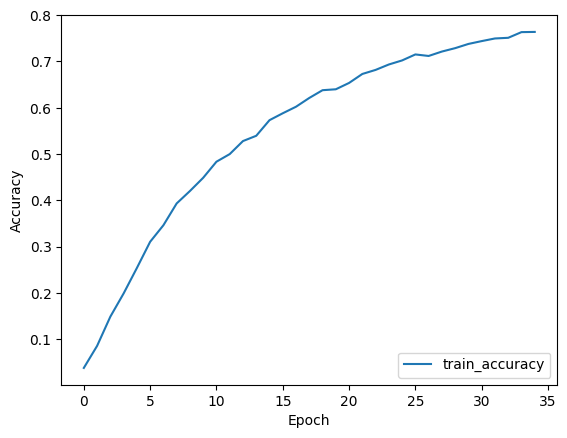

In [26]:
# this is the model that got 70% acc before, let's give it more epochs
def create_model():
    model = tf.keras.models.Sequential([
        tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 1)),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Dropout(0.3), # Higher dropout to regularize

        tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Dropout(0.3), # Higher dropout to regularize

        tf.keras.layers.Conv2D(128, (3, 3), activation='relu'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Dropout(0.3), # Higher dropout to regularize

        tf.keras.layers.Conv2D(256, (3, 3), activation='relu'),  
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Dropout(0.3), # Higher dropout to regularize

        tf.keras.layers.Conv2D(512, (3, 3), activation='relu'),  # more layers respect to original 70% model
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Dropout(0.3),

        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(256, activation='relu'), 
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Dropout(0.5),  # Higher dropout to regularize

        tf.keras.layers.Dense(len(class_names), activation='softmax')
    ])
    return model

# Compile with a lower learning rate
model = create_model()
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0005), 
              loss='sparse_categorical_crossentropy', 
              metrics=['accuracy'])

history = model.fit(train_data, epochs=35) # more epochs

print_results()


Epoch 1/35


/opt/miniconda3/envs/ml/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


284/284 ━━━━━━━━━━━━━━━━━━━━ 69s 201ms/step - accuracy: 0.0303 - loss: 5.2064
Epoch 2/35


/opt/miniconda3/envs/ml/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


284/284 ━━━━━━━━━━━━━━━━━━━━ 66s 200ms/step - accuracy: 0.0988 - loss: 4.1200
Epoch 3/35
284/284 ━━━━━━━━━━━━━━━━━━━━ 66s 200ms/step - accuracy: 0.1819 - loss: 3.5707
Epoch 4/35
284/284 ━━━━━━━━━━━━━━━━━━━━ 66s 201ms/step - accuracy: 0.2571 - loss: 3.1337
Epoch 5/35
284/284 ━━━━━━━━━━━━━━━━━━━━ 66s 201ms/step - accuracy: 0.3217 - loss: 2.8269
Epoch 6/35
284/284 ━━━━━━━━━━━━━━━━━━━━ 66s 199ms/step - accuracy: 0.3719 - loss: 2.5914
Epoch 7/35
284/284 ━━━━━━━━━━━━━━━━━━━━ 66s 199ms/step - accuracy: 0.4120 - loss: 2.3947
Epoch 8/35
284/284 ━━━━━━━━━━━━━━━━━━━━ 66s 199ms/step - accuracy: 0.4411 - loss: 2.1913
Epoch 9/35
284/284 ━━━━━━━━━━━━━━━━━━━━ 66s 200ms/step - accuracy: 0.4754 - loss: 2.0678
Epoch 10/35
284/284 ━━━━━━━━━━━━━━━━━━━━ 66s 200ms/step - accuracy: 0.5050 - loss: 1.9411
Epoch 11/35
284/284 ━━━━━━━━━━━━━━━━━━━━ 66s 200ms/step - accuracy: 0.5171 - loss: 1.8915
Epoch 12/35
284/284 ━━━━━━━━━━━━━━━━━━━━ 66s 200ms/step - accuracy: 0.5541 - loss: 1.7324
Epoch 13/35
284/284 ━━━━━━━━━

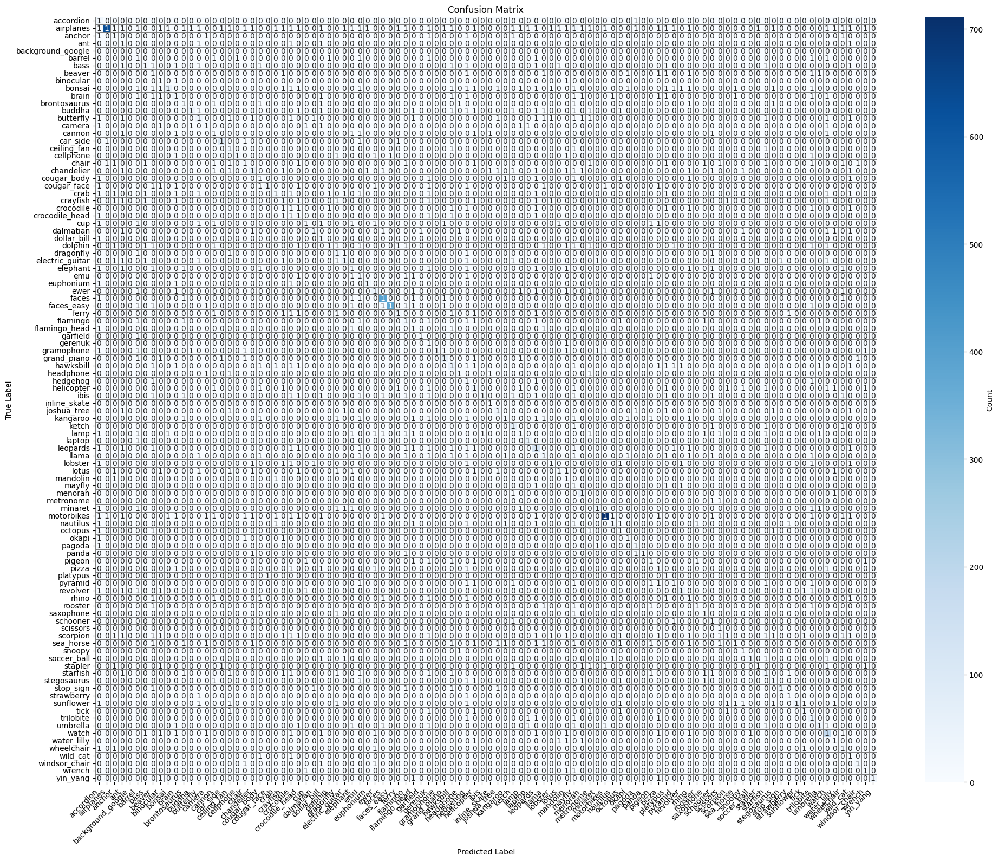

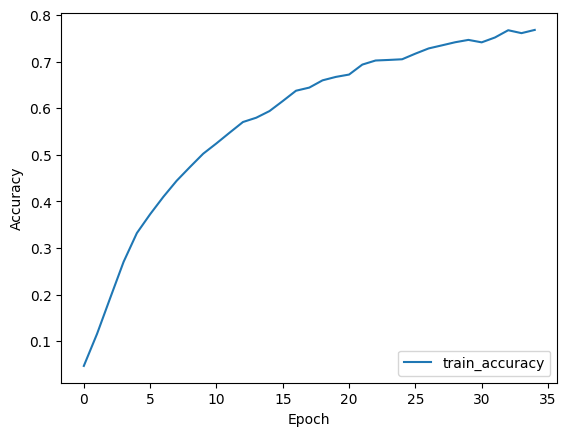

In [27]:
# this is the same as the model right above but with a changing learning rate
def create_model():
    model = tf.keras.models.Sequential([
        tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 1)),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Dropout(0.3), # Higher dropout to regularize

        tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Dropout(0.3), # Higher dropout to regularize

        tf.keras.layers.Conv2D(128, (3, 3), activation='relu'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Dropout(0.3), # Higher dropout to regularize

        tf.keras.layers.Conv2D(256, (3, 3), activation='relu'),  
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Dropout(0.3), # Higher dropout to regularize

        tf.keras.layers.Conv2D(512, (3, 3), activation='relu'),  # more layers respect to original 70% model
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Dropout(0.3),

        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(256, activation='relu'), 
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Dropout(0.5),  # Higher dropout to regularize

        tf.keras.layers.Dense(len(class_names), activation='softmax')
    ])
    return model

lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=0.001,
    decay_steps=5000,
    decay_rate=0.95)

# Compile with a lower learning rate
model = create_model()
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=lr_schedule), 
              loss='sparse_categorical_crossentropy', 
              metrics=['accuracy'])

history = model.fit(train_data, epochs=35) # more epochs

print_results()


Epoch 1/35


/opt/miniconda3/envs/ml/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


284/284 ━━━━━━━━━━━━━━━━━━━━ 66s 192ms/step - accuracy: 0.0457 - loss: 4.8047
Epoch 2/35


/opt/miniconda3/envs/ml/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


284/284 ━━━━━━━━━━━━━━━━━━━━ 63s 191ms/step - accuracy: 0.1855 - loss: 3.6211
Epoch 3/35
284/284 ━━━━━━━━━━━━━━━━━━━━ 63s 191ms/step - accuracy: 0.2908 - loss: 3.0518
Epoch 4/35
284/284 ━━━━━━━━━━━━━━━━━━━━ 64s 192ms/step - accuracy: 0.3451 - loss: 2.7499
Epoch 5/35
284/284 ━━━━━━━━━━━━━━━━━━━━ 64s 192ms/step - accuracy: 0.3972 - loss: 2.5209
Epoch 6/35
284/284 ━━━━━━━━━━━━━━━━━━━━ 64s 191ms/step - accuracy: 0.4452 - loss: 2.2677
Epoch 7/35
284/284 ━━━━━━━━━━━━━━━━━━━━ 63s 191ms/step - accuracy: 0.4944 - loss: 2.1000
Epoch 8/35
284/284 ━━━━━━━━━━━━━━━━━━━━ 63s 190ms/step - accuracy: 0.5189 - loss: 1.9622
Epoch 9/35
284/284 ━━━━━━━━━━━━━━━━━━━━ 64s 192ms/step - accuracy: 0.5546 - loss: 1.7876
Epoch 10/35
284/284 ━━━━━━━━━━━━━━━━━━━━ 65s 195ms/step - accuracy: 0.5703 - loss: 1.6981
Epoch 11/35
284/284 ━━━━━━━━━━━━━━━━━━━━ 63s 190ms/step - accuracy: 0.6051 - loss: 1.5754
Epoch 12/35
284/284 ━━━━━━━━━━━━━━━━━━━━ 64s 191ms/step - accuracy: 0.6281 - loss: 1.4686
Epoch 13/35
284/284 ━━━━━━━━━

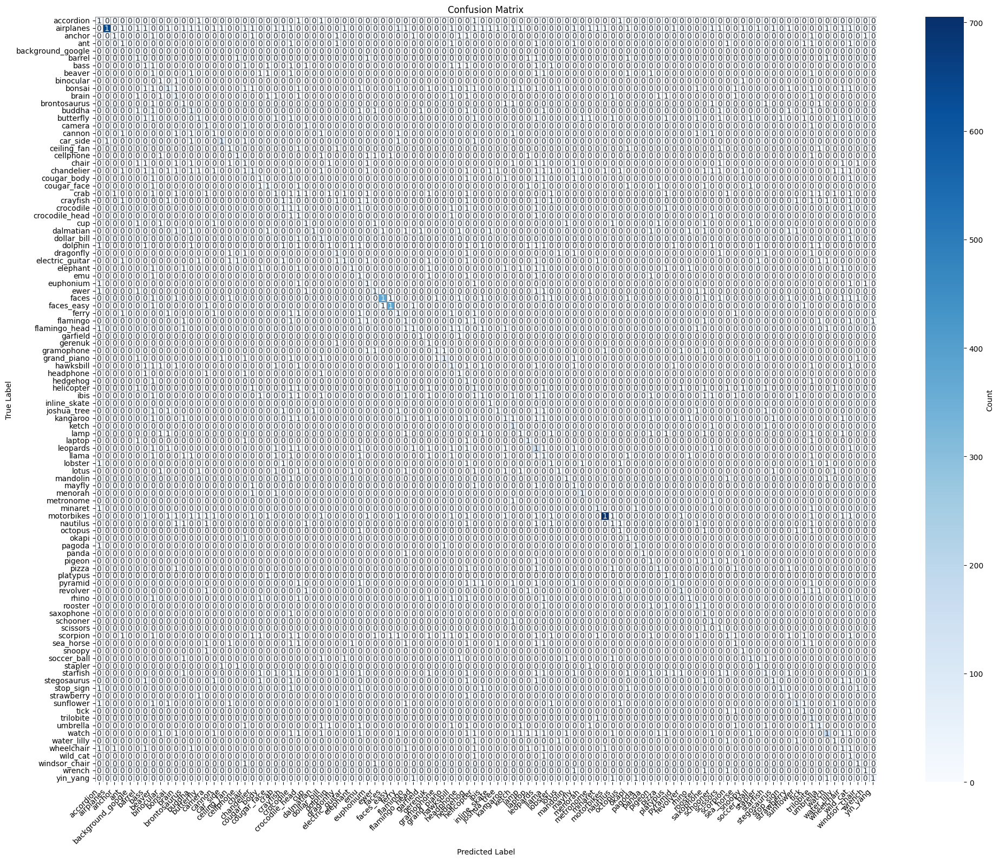

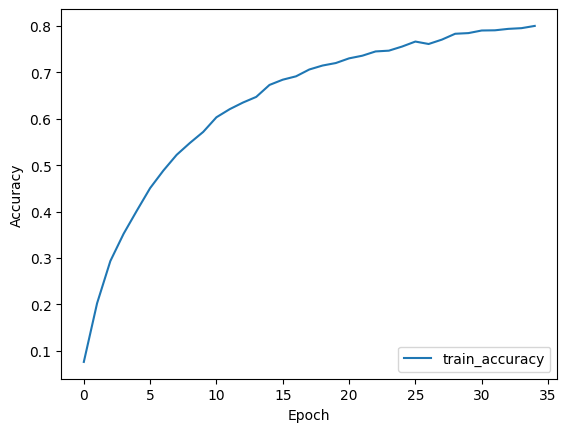

In [28]:
def create_model():
    model = tf.keras.models.Sequential([
        tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 1)),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Dropout(0.25),

        tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Dropout(0.25),

        tf.keras.layers.Conv2D(128, (3, 3), activation='relu'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Dropout(0.3),

        tf.keras.layers.Conv2D(256, (3, 3), activation='relu'),  # Additional layer
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Dropout(0.3),

        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(256, activation='relu'),  # Increased dense layer size
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Dropout(0.4),  # Higher dropout to regularize

        tf.keras.layers.Dense(len(class_names), activation='softmax')
    ])
    return model

# Compile with a lower learning rate
model = create_model()
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0005), 
              loss='sparse_categorical_crossentropy', 
              metrics=['accuracy'])

history = model.fit(train_data, epochs=35)

print_results()
